# Feature Engineering Notebook
### Objectives
* Engineer features for Regression and Cluster models

### Inputs
* inputs/datasets/cleaned/TrainSet.csv
* inputs/datasets/cleaned/TestSet.csv
### Outputs
* generate a list with variables to engineer

# Change working directory

We need to change the working directory from its current folder to its parent folder

  * We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'C:\\Users\\issam\\Housing-market-analysis.1\\jupyter_notebooks'

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


In [3]:
current_dir = os.getcwd()
current_dir

'C:\\Users\\issam\\Housing-market-analysis.1'

## Load Cleaned Data
Train Set

In [4]:
import pandas as pd
XtrainSet = pd.read_csv("outputs/datasets/cleaned/X_TrainCleaned.csv") #"/workspace/Housing-market-analysis./house-price-20211124T154130Z-001/house_prices_records.csv")
XtrainSet = XtrainSet.dropna()
print(XtrainSet.columns)
XtrainSet.head()

Index(['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtExposure', 'BsmtFinSF1',
       'BsmtFinType1', 'BsmtUnfSF', 'GarageArea', 'GarageFinish',
       'GarageYrBlt', 'GrLivArea', 'KitchenQual', 'LotArea', 'LotFrontage',
       'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual',
       'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd'],
      dtype='object')


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,KitchenQual,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd
0,2158,0.0,4.0,Av,477,ALQ,725,576,Unf,1950.0,...,Gd,12615,84.0,0.0,29,7,6,1202,1950,2001
1,1614,0.0,3.0,Av,20,GLQ,1594,865,RFn,2005.0,...,Gd,11210,86.0,240.0,59,5,7,1614,2005,2006
6,1412,0.0,3.0,Mn,1005,GLQ,387,576,Unf,1988.0,...,Gd,11457,130.0,0.0,0,5,6,1392,1988,1988
10,1504,0.0,2.0,No,16,GLQ,1330,437,Fin,2005.0,...,Gd,3182,43.0,14.0,20,5,7,1346,2005,2006
12,672,672.0,3.0,No,456,Rec,216,468,Unf,1964.0,...,TA,10690,59.0,0.0,128,7,5,672,1920,1997


Test Set

In [5]:
XTestSet = pd.read_csv("outputs/datasets/cleaned/X_testCleaned.csv")
print(len(XTestSet))
XTestSet = XTestSet.dropna()
print(len(XTestSet))
print(XTestSet.columns)
XTestSet.head()

292
165
Index(['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtExposure', 'BsmtFinSF1',
       'BsmtFinType1', 'BsmtUnfSF', 'GarageArea', 'GarageFinish',
       'GarageYrBlt', 'GrLivArea', 'KitchenQual', 'LotArea', 'LotFrontage',
       'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual',
       'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd'],
      dtype='object')


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,KitchenQual,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd
0,1091,898.0,3.0,Mn,932,GLQ,133,586,Fin,2002.0,...,Gd,11367,90.0,210.0,60,5,8,1065,2002,2002
2,1040,0.0,3.0,Mn,532,LwQ,364,484,Unf,1977.0,...,Gd,8800,61.0,0.0,0,7,5,1040,1977,2008
3,1572,1096.0,3.0,Av,1016,GLQ,556,726,Fin,2003.0,...,Ex,13688,110.0,664.0,0,5,9,1572,2003,2004
4,2020,0.0,3.0,No,1436,GLQ,570,900,Fin,2009.0,...,Ex,12220,94.0,305.0,54,5,10,2006,2009,2009
7,520,600.0,2.0,No,0,Unf,600,480,RFn,2005.0,...,Gd,3180,30.0,0.0,166,5,7,600,2005,2005


## Data Exploration

In [6]:
from ydata_profiling import ProfileReport
pandas_report = ProfileReport(df=XtrainSet, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature Engineering

### Custom function

In [7]:
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from IPython.display import Image, display
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings('ignore')



def FeatureEngineeringAnalysis(df,analysis_type=None):


  """
  - used for quick feature engineering on numerical and categorical variables
  to decide which transformation can better transform the distribution shape 
  - Once transformed, use a reporting tool, like pandas-profiling, to evaluate distributions

  """
  check_missing_values(df)
  allowed_types= ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
  check_user_entry_on_analysis_type(analysis_type, allowed_types)
  list_column_transformers = define_list_column_transformers(analysis_type)
  
  
  # Loop over each variable and engineer the data according to the analysis type
  df_feat_eng = pd.DataFrame([])
  for column in df.columns:
    # create additional columns (column_method) to apply the methods
    df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
    for method in list_column_transformers:
      df_feat_eng[f"{column}_{method}"] = df[column]
      
    # Apply transformers in respectives column_transformers
    df_feat_eng, list_applied_transformers = apply_transformers(analysis_type, df_feat_eng, column)

    # For each variable, assess how the transformations perform
    transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng)

  return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
  ### Check analyis type
  if analysis_type == None:
    raise SystemExit(
      f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
  if analysis_type not in allowed_types:
      raise SystemExit(
        f"analysis_type argument should be one of these options: {allowed_types}")

def check_missing_values(df):
  if df.isna().sum().sum() != 0:
    raise SystemExit(
        f"There is missing values in your dataset. Please handle that before getting into feature engineering.")



def define_list_column_transformers(analysis_type):
  ### Set suffix colummns acording to analysis_type
  if analysis_type=='numerical':
    list_column_transformers = ["log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]
  
  elif analysis_type=='ordinal_encoder':
    list_column_transformers = ["ordinal_encoder"]

  elif analysis_type=='outlier_winsorizer':
    list_column_transformers = ['iqr']

  return list_column_transformers



def apply_transformers(analysis_type, df_feat_eng, column):


  for col in df_feat_eng.select_dtypes(include='category').columns:
    df_feat_eng[col] = df_feat_eng[col].astype('object')


  if analysis_type=='numerical':
    df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(df_feat_eng,column)
  
  elif analysis_type=='outlier_winsorizer':
    df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(df_feat_eng,column)

  elif analysis_type=='ordinal_encoder':
    df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(df_feat_eng,column)

  return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
  # For each variable, assess how the transformations perform
  print(f"* Variable Analyzed: {column}")
  print(f"* Applied transformation: {list_applied_transformers} \n")
  for col in [column] + list_applied_transformers:
    
    if analysis_type!='ordinal_encoder':
      DiagnosticPlots_Numerical(df_feat_eng, col)
    
    else:
      if col == column: 
        DiagnosticPlots_Categories(df_feat_eng, col)
      else:
        DiagnosticPlots_Numerical(df_feat_eng, col)

    print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
  plt.figure(figsize=(20, 5))
  sns.countplot(data=df_feat_eng, x=col, palette=['#432371'], order = df_feat_eng[col].value_counts().index)
  plt.xticks(rotation=90) 
  plt.suptitle(f"{col}", fontsize=30, y=1.0)        
  #plt.show();
  plt.savefig('DiagnosticPlots_Categories.png')
  numerical_image = Image('DiagnosticPlots_Categories.png')
  display(numerical_image)  
  print("\n")


def DiagnosticPlots_Numerical(df, variable):
  fig, axes = plt.subplots(1, 3, figsize=(20, 8))
  sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0]) 
  stats.probplot(df[variable], dist="norm", plot=axes[1])
  sns.boxplot(x=df[variable], ax=axes[2])
  
  axes[0].set_title('Histogram')
  axes[1].set_title('QQ Plot')
  axes[2].set_title('Boxplot')
  fig.suptitle(f"{variable}", fontsize=30, y=1.0)
  #plt.show();
  plt.savefig('DiagnosticPlots_Numerical.png')
  numerical_image = Image('DiagnosticPlots_Numerical.png')
  display(numerical_image) 


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
  list_methods_worked = []
  try:  
    encoder= OrdinalEncoder(encoding_method='arbitrary', variables = [f"{column}_ordinal_encoder"])
    df_feat_eng = encoder.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_ordinal_encoder")
  
  except: 
    df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)
    
  return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng, column):
  list_methods_worked = []

  ### Winsorizer iqr
  try: 
    disc=Winsorizer(
        capping_method='iqr', tail='both', fold=1.5, variables = [f"{column}_iqr"])
    df_feat_eng = disc.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_iqr")
  except: 
    df_feat_eng.drop([f"{column}_iqr"], axis=1, inplace=True)


  return df_feat_eng, list_methods_worked



def FeatEngineering_Numerical(df_feat_eng,column):

  list_methods_worked = []

  ### LogTransformer base e
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_e"])
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_e")
  except: 
    df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

    ### LogTransformer base 10
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_10"], base='10')
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_10")
  except: 
    df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

  ### ReciprocalTransformer
  try:
    rt = vt.ReciprocalTransformer(variables = [f"{column}_reciprocal"])
    df_feat_eng =  rt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_reciprocal")
  except:
    df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

  ### PowerTransformer
  try:
    pt = vt.PowerTransformer(variables = [f"{column}_power"])
    df_feat_eng = pt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_power")
  except:
    df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

  ### BoxCoxTransformer
  try:
    bct = vt.BoxCoxTransformer(variables = [f"{column}_box_cox"])
    df_feat_eng = bct.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_box_cox")
  except:
    df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)
#ss

  ### YeoJohnsonTransformer
  try:
    yjt = vt.YeoJohnsonTransformer(variables = [f"{column}_yeo_johnson"])
    df_feat_eng = yjt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_yeo_johnson")
  except:
        df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)


  return df_feat_eng, list_methods_worked

## Dealing with Feature Engineering
### Categorical Encoding - Ordinal: replaces categories with ordinal numbers

* Step 1: Select variable(s)

In [8]:
features_engineering = [ 'BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']
features_engineering

['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']

* Step 2: Create a separate DataFrame, with your variable(s)

In [9]:
df_engineering = XtrainSet[features_engineering].copy()
print(df_engineering.head())
df_engineering = df_engineering.dropna() #subset=['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual'])
df_engineering.isna().sum()

   BsmtExposure BsmtFinType1 GarageFinish KitchenQual
0            Av          ALQ          Unf          Gd
1            Av          GLQ          RFn          Gd
6            Mn          GLQ          Unf          Gd
10           No          GLQ          Fin          Gd
12           No          Rec          Unf          TA


BsmtExposure    0
BsmtFinType1    0
GarageFinish    0
KitchenQual     0
dtype: int64

* Step 3: Create engineered variables(s) by applying the transformation(s), assess engineered variables distribution and select the most suitable method for each variable.

* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_ordinal_encoder'] 



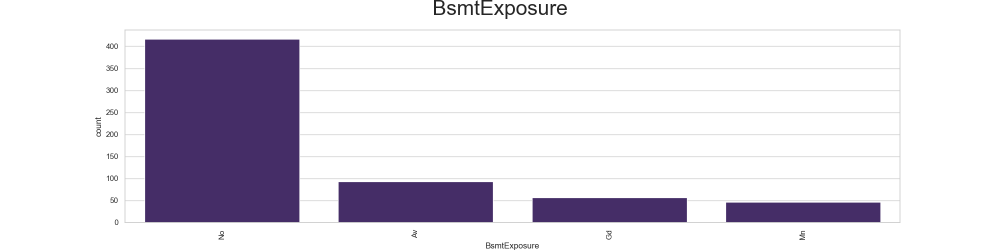

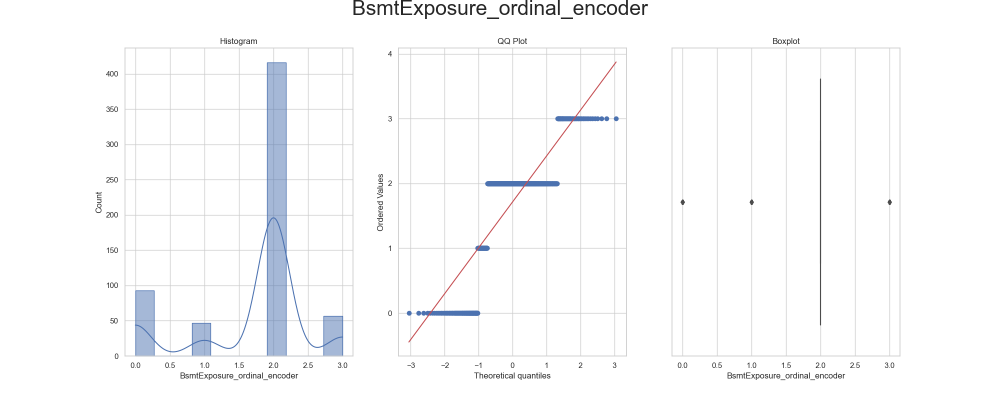



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_ordinal_encoder'] 



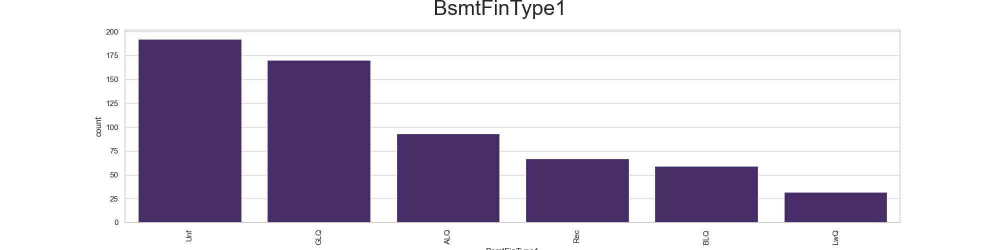

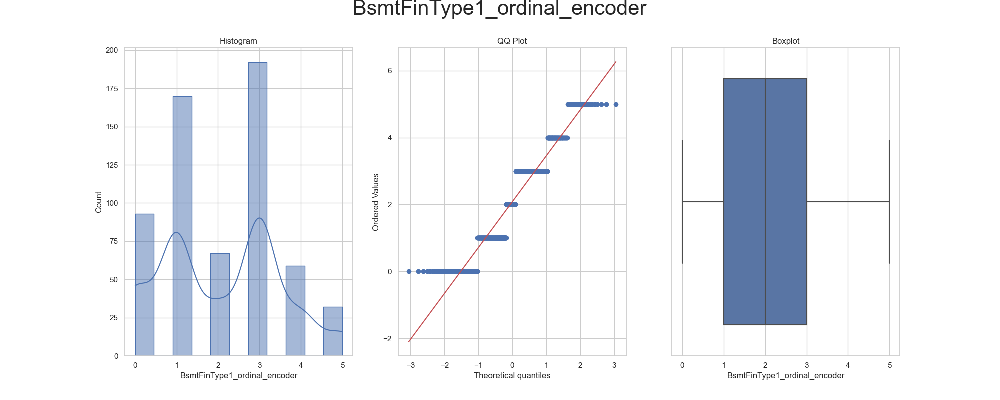



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_ordinal_encoder'] 



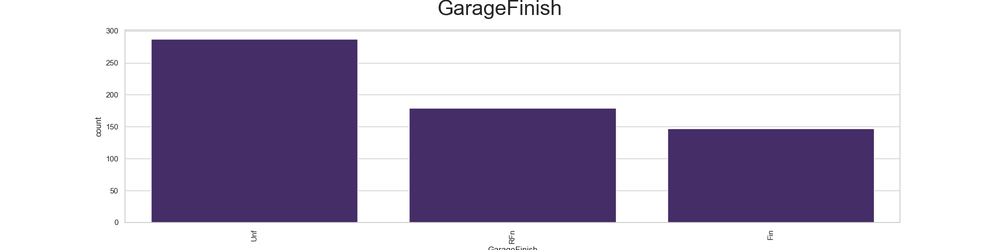

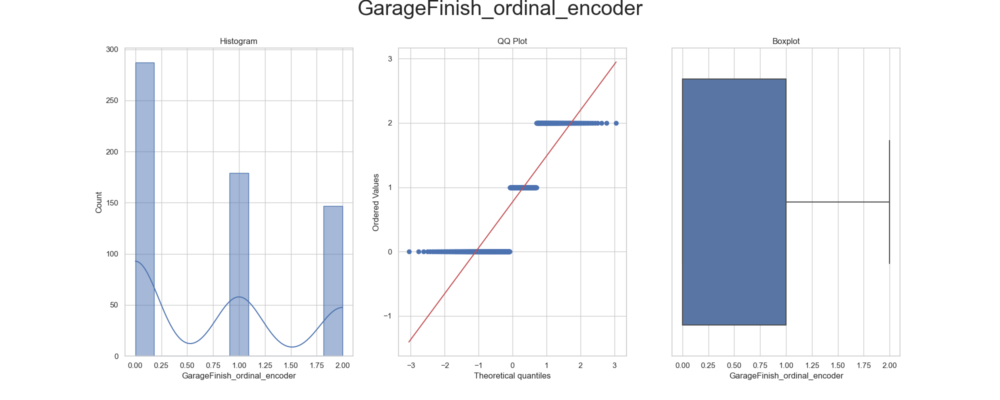



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_ordinal_encoder'] 



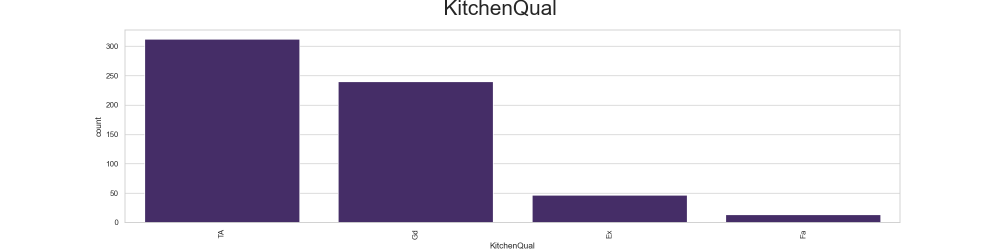

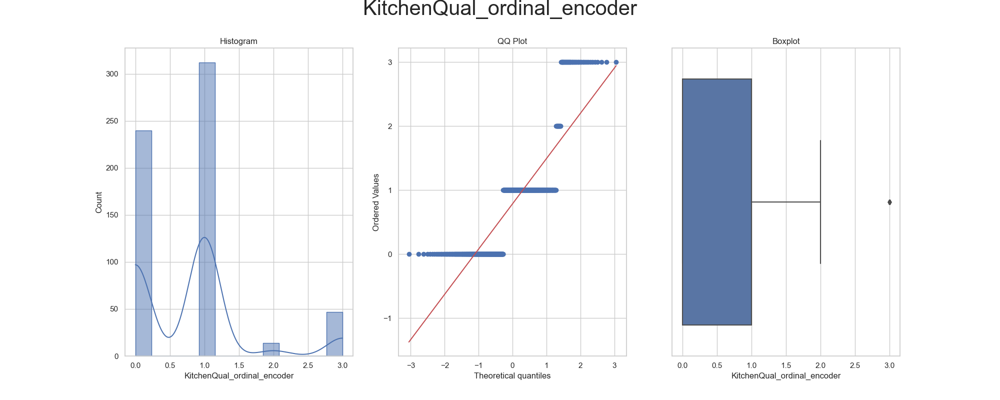

In [10]:
    df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='ordinal_encoder')

In [11]:
# 1 - create a transformer
encoder = OrdinalEncoder(encoding_method='arbitrary', variables = features_engineering)

# 2 - fit_transform into TrainSet
TrainSet = encoder.fit_transform(XtrainSet)

# 3 - transform into TestSet 
TestSet = encoder.fit_transform(XTestSet)

print("* Categorical encoding - ordinal transformation inplace")

* Categorical encoding - ordinal transformation inplace


### Numerical Transformation
* Step 1: Select variables(s)

In [12]:
features_engineering = ['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 
                        'BsmtUnfSF', 'MasVnrArea', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 
                        'LotArea', 'LotFrontage',  'OpenPorchSF', 'OverallCond', 
                        'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd']
features_engineering

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'MasVnrArea',
 'GarageArea',
 'GarageYrBlt',
 'GrLivArea',
 'LotArea',
 'LotFrontage',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'YearBuilt',
 'YearRemodAdd']

* Step 2: Create a separate DataFrame, with your variable(s)

In [13]:
print(features_engineering)
print(XtrainSet.columns)
df_engineering = XtrainSet[features_engineering].copy()
df_engineering.head()

['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtUnfSF', 'MasVnrArea', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 'LotArea', 'LotFrontage', 'OpenPorchSF', 'OverallCond', 'OverallQual', 'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd']
Index(['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtExposure', 'BsmtFinSF1',
       'BsmtFinType1', 'BsmtUnfSF', 'GarageArea', 'GarageFinish',
       'GarageYrBlt', 'GrLivArea', 'KitchenQual', 'LotArea', 'LotFrontage',
       'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual',
       'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd'],
      dtype='object')


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtFinSF1,BsmtUnfSF,MasVnrArea,GarageArea,GarageYrBlt,GrLivArea,LotArea,LotFrontage,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd
0,2158,0.0,4.0,477,725,0.0,576,1950.0,2158,12615,84.0,29,7,6,1202,1950,2001
1,1614,0.0,3.0,20,1594,240.0,865,2005.0,1614,11210,86.0,59,5,7,1614,2005,2006
6,1412,0.0,3.0,1005,387,0.0,576,1988.0,1412,11457,130.0,0,5,6,1392,1988,1988
10,1504,0.0,2.0,16,1330,14.0,437,2005.0,1504,3182,43.0,20,5,7,1346,2005,2006
12,672,672.0,3.0,456,216,0.0,468,1964.0,1344,10690,59.0,128,7,5,672,1920,1997


* Step 3: Create engineered variables(s) by applying the transformation(s), assess engineered variables distribution and select the most suitable method

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



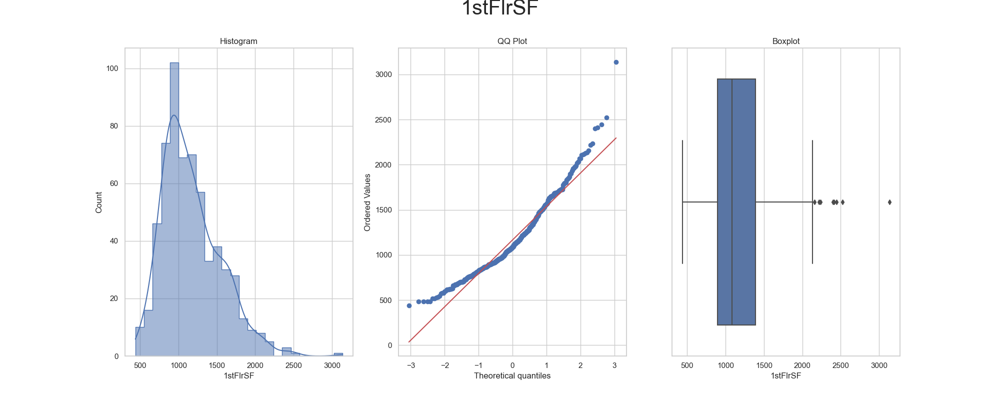

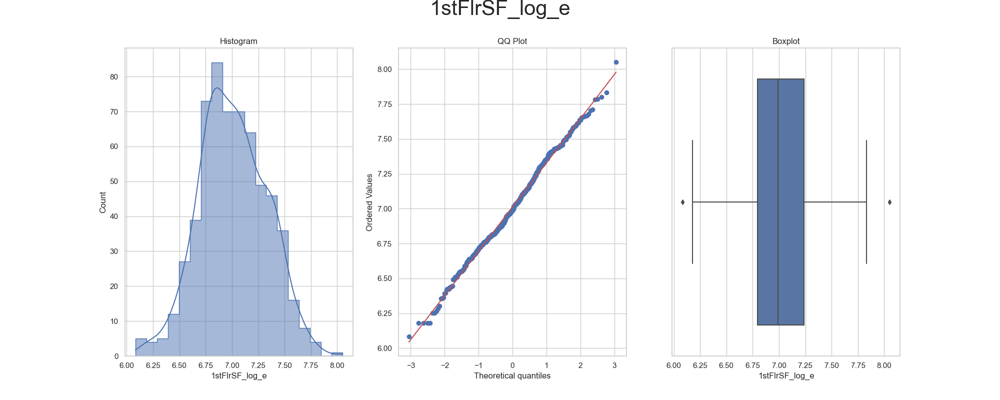

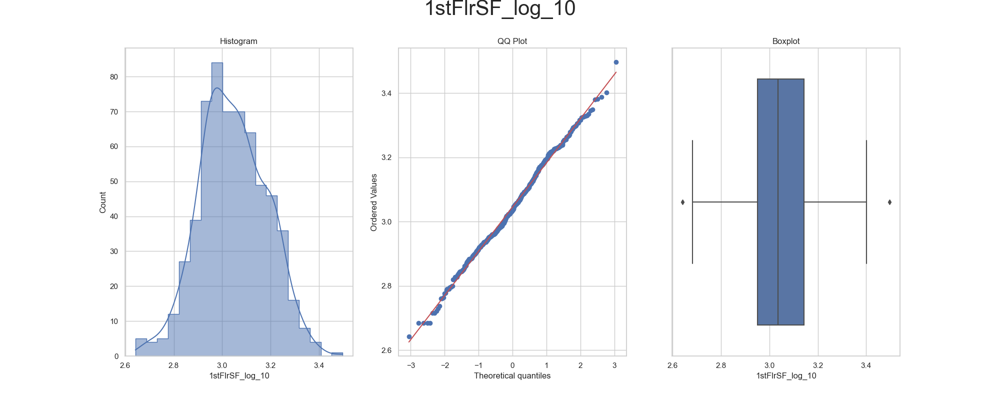

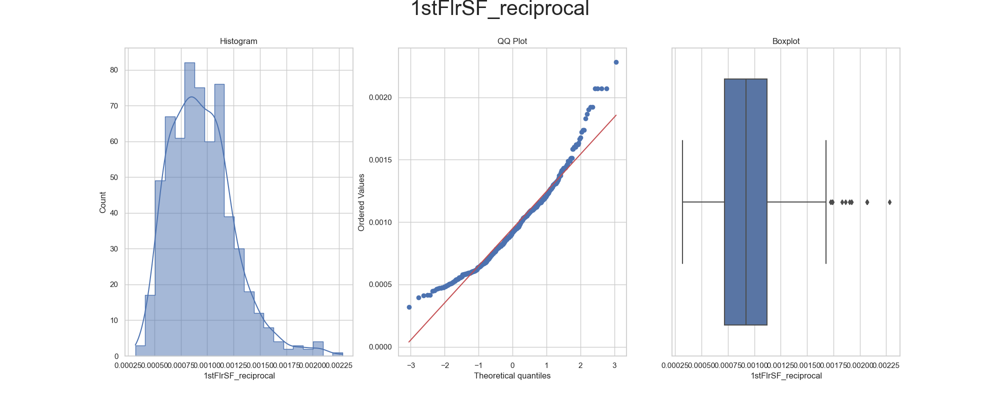

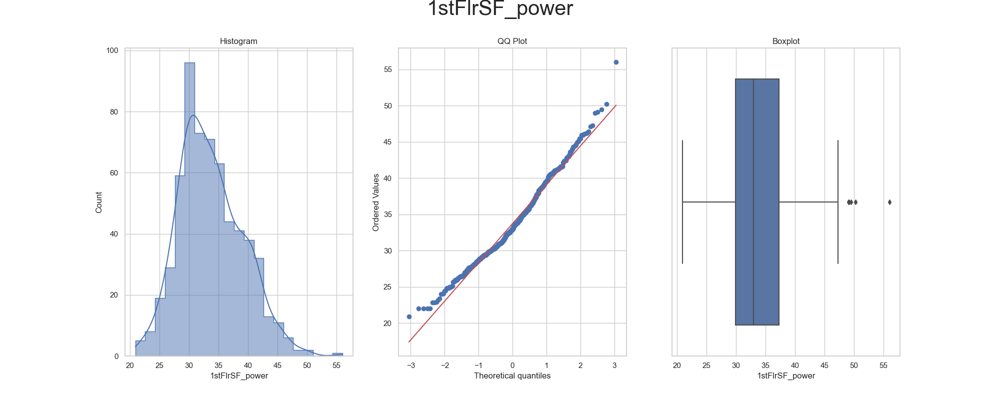

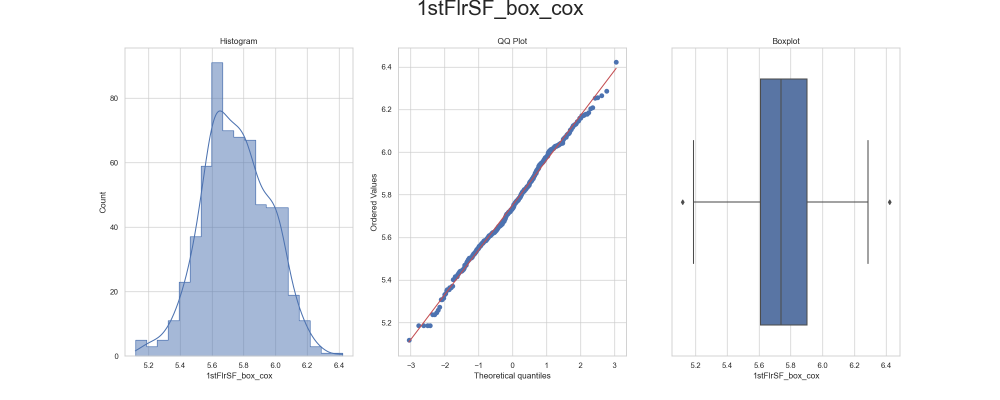

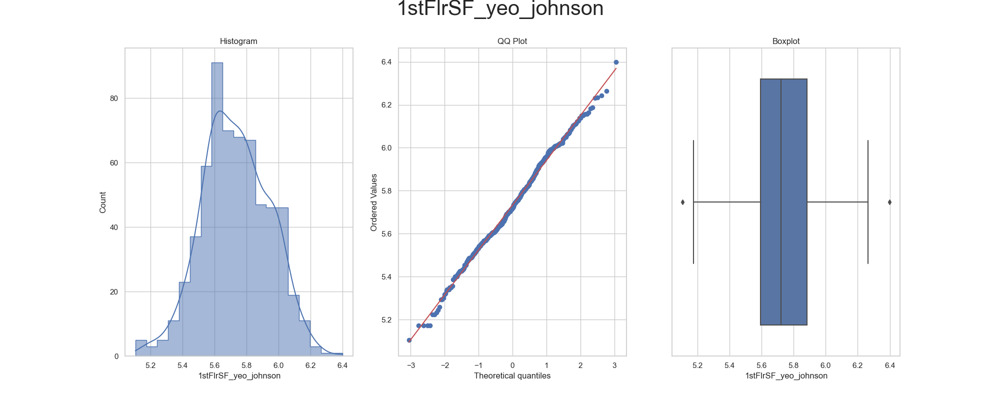



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_power', '2ndFlrSF_yeo_johnson'] 



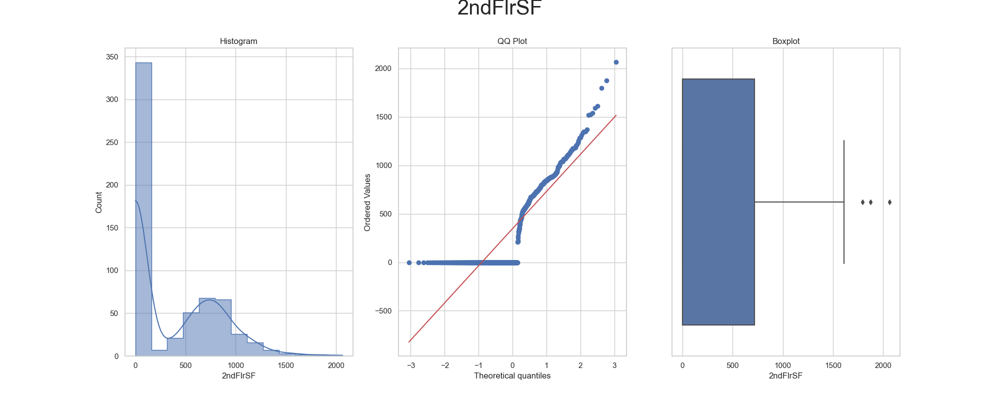

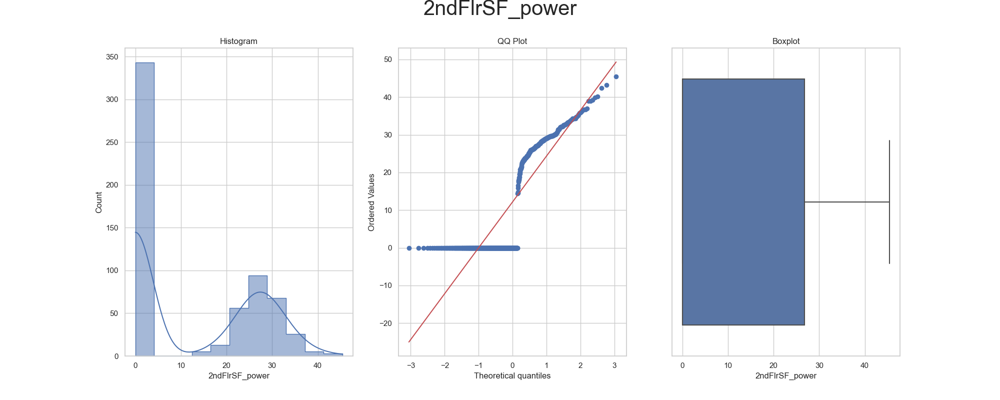

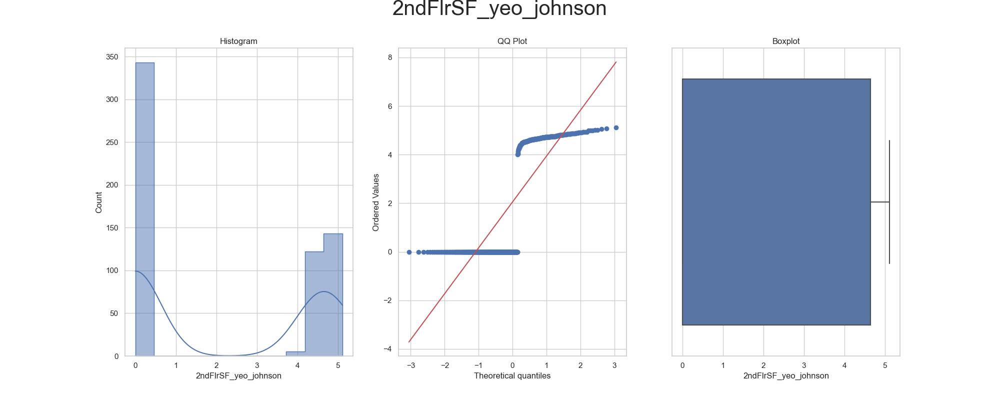



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



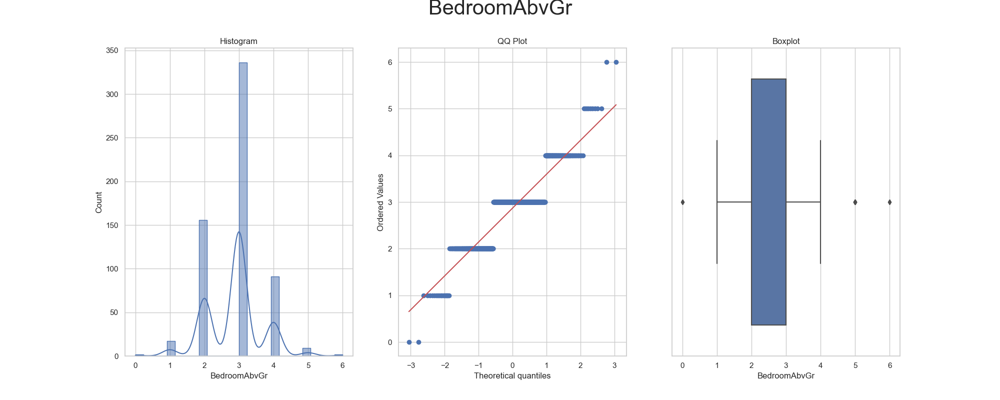

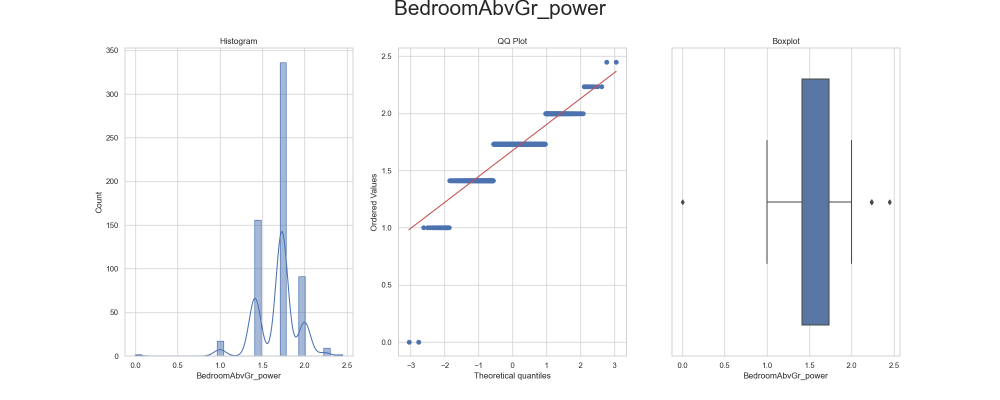

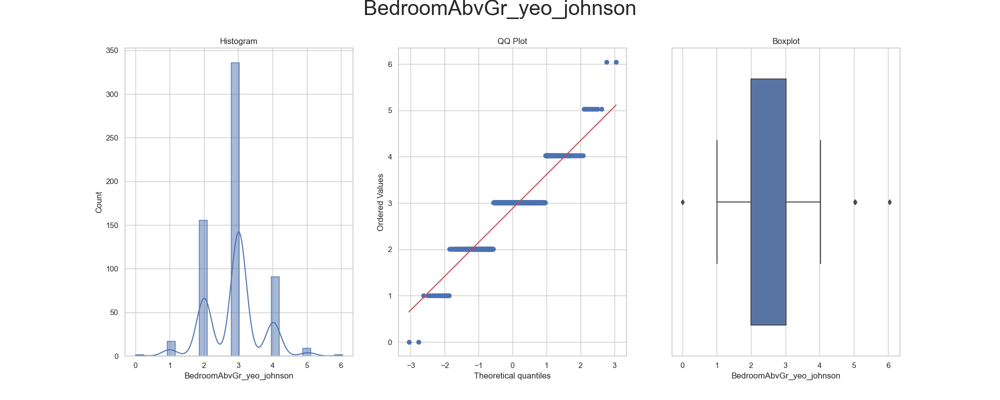



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_power', 'BsmtFinSF1_yeo_johnson'] 



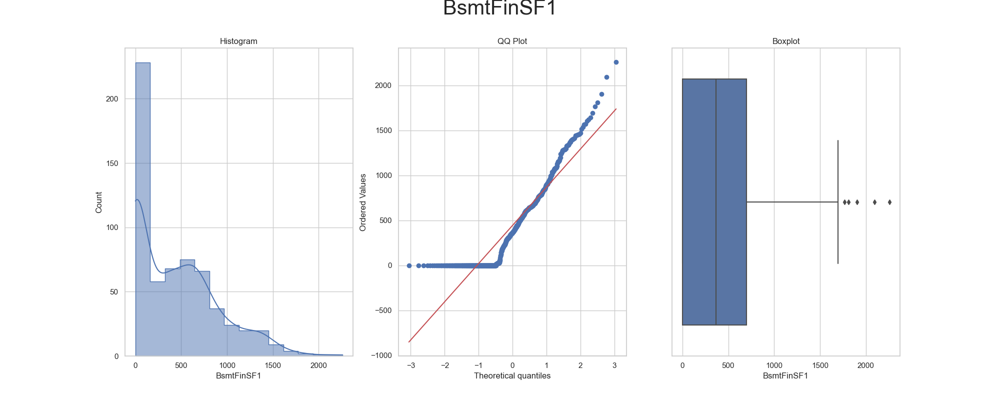

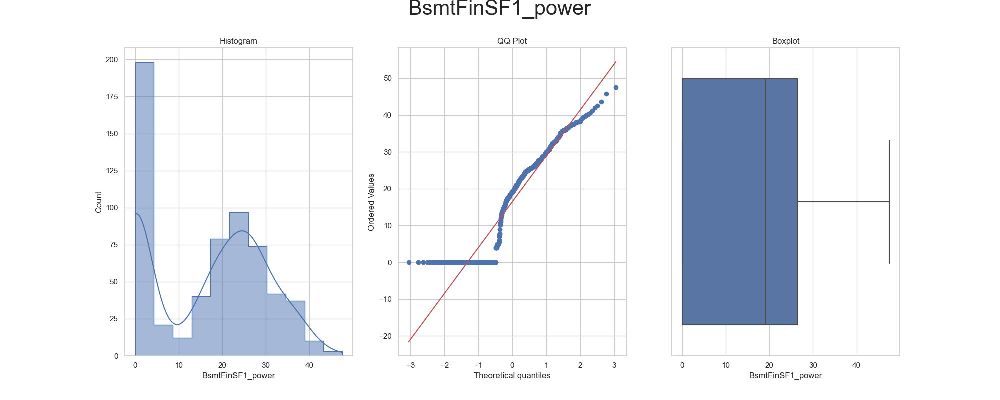

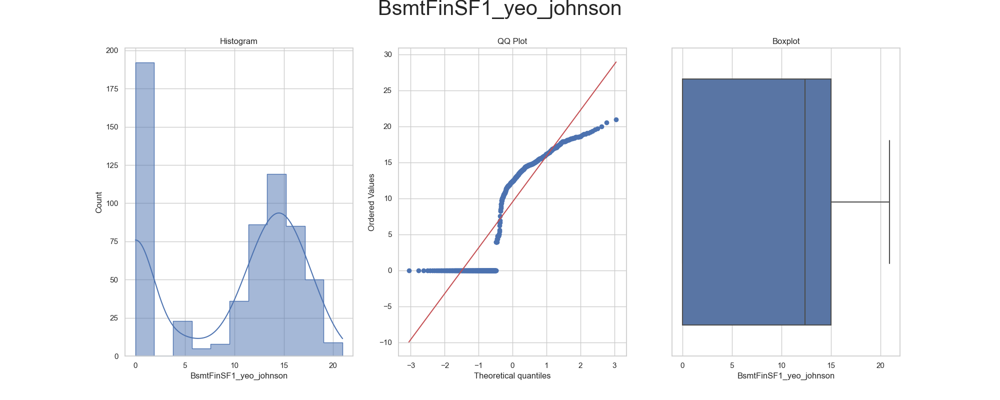



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_power', 'BsmtUnfSF_yeo_johnson'] 



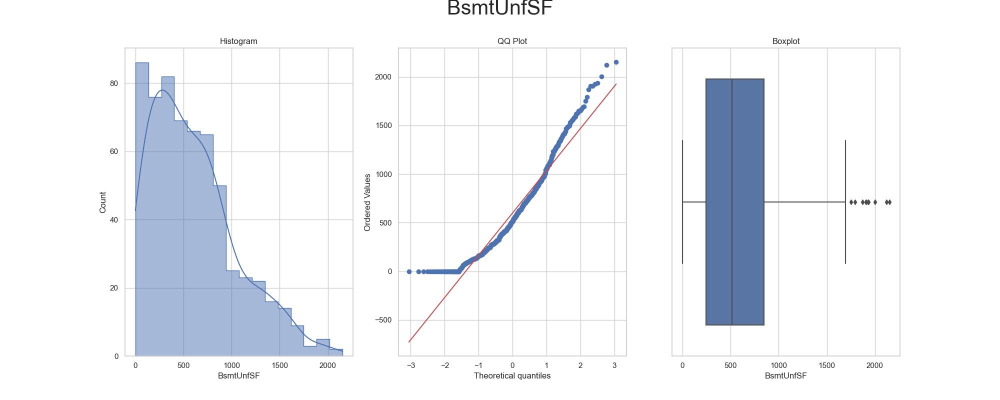

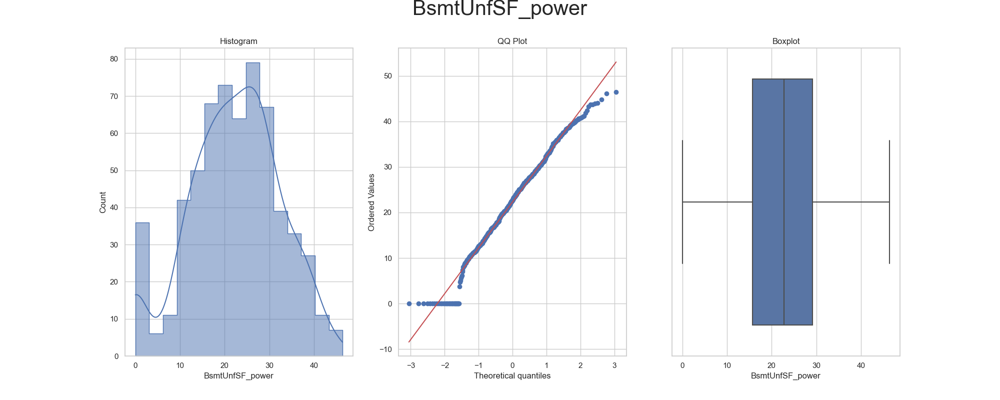

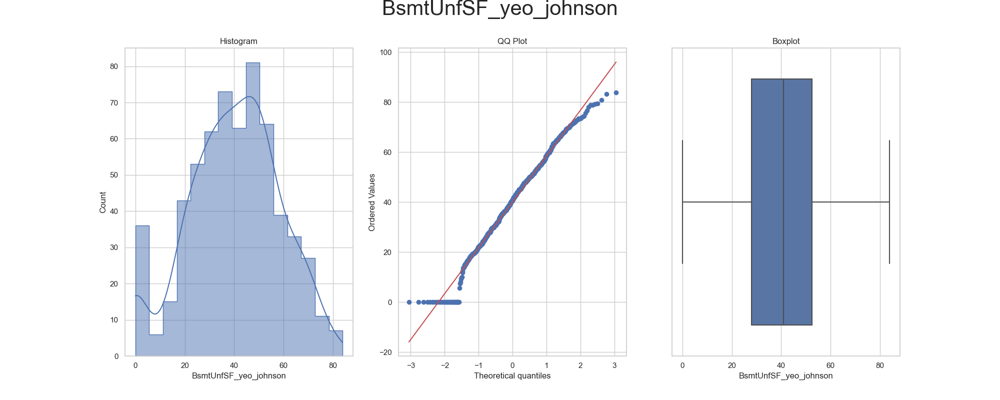



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_power', 'MasVnrArea_yeo_johnson'] 



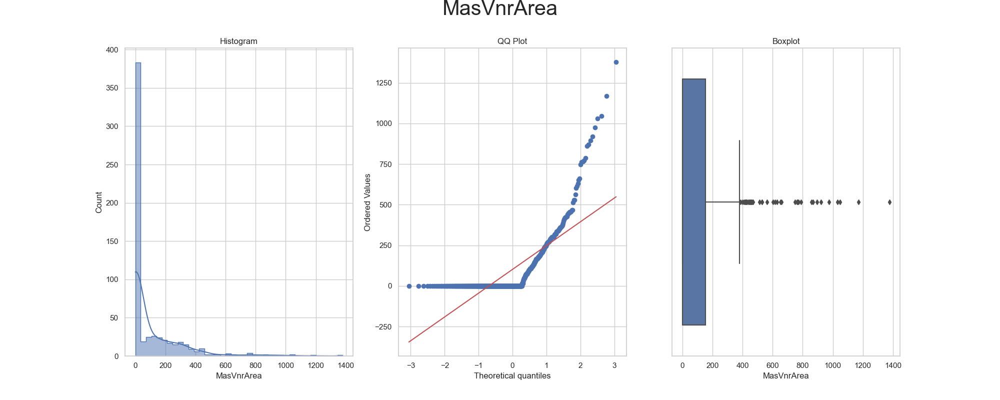

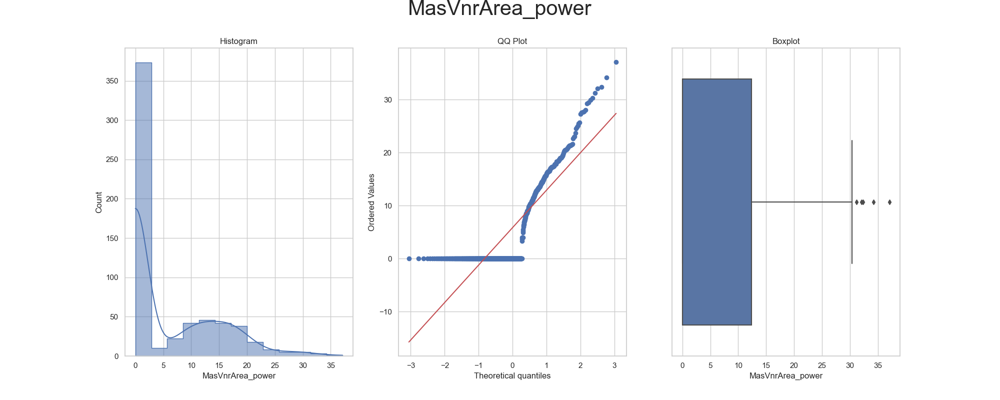

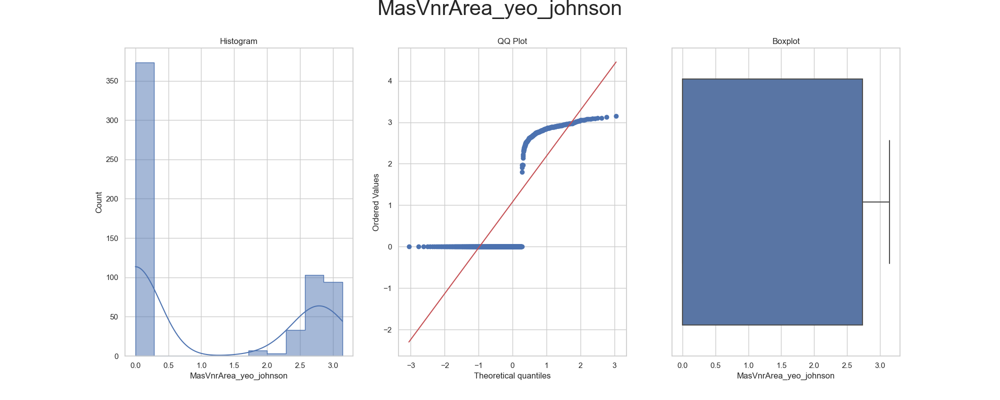



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_log_e', 'GarageArea_log_10', 'GarageArea_reciprocal', 'GarageArea_power', 'GarageArea_box_cox', 'GarageArea_yeo_johnson'] 



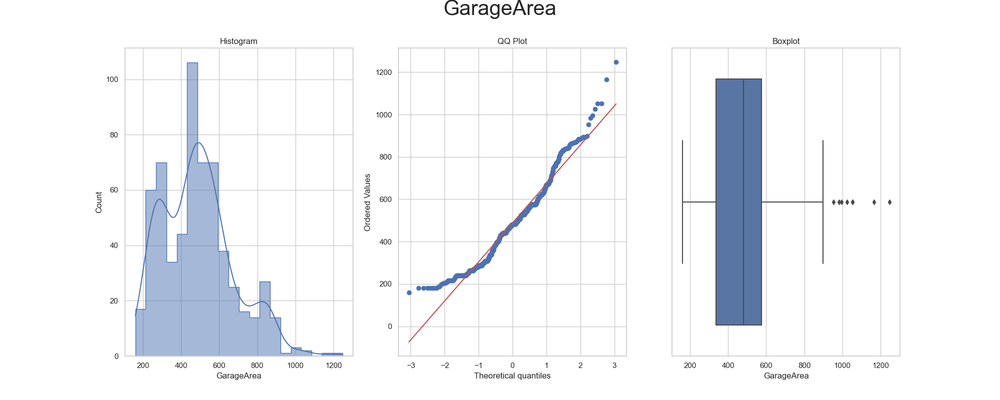

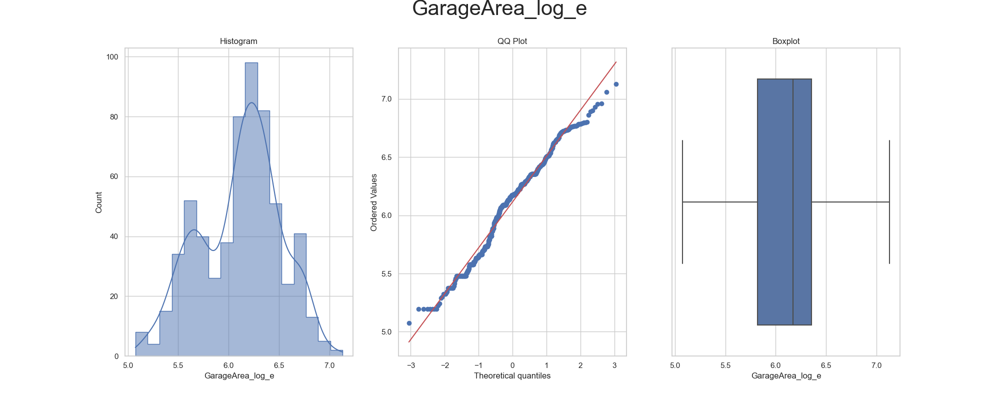

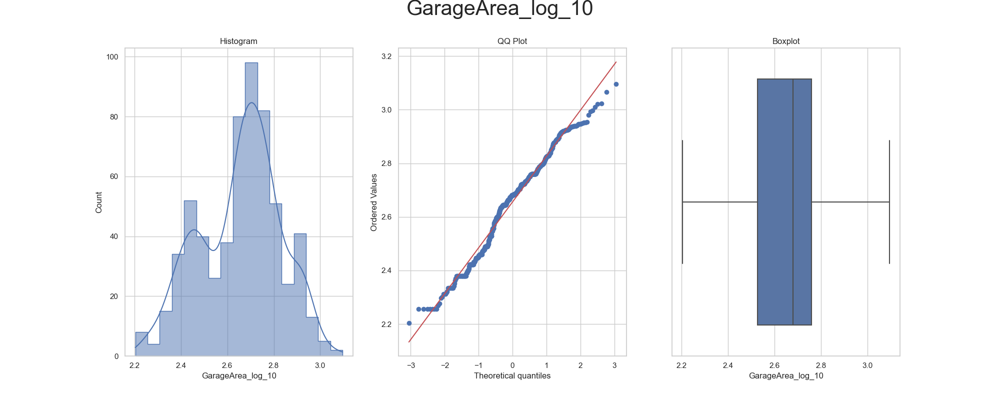

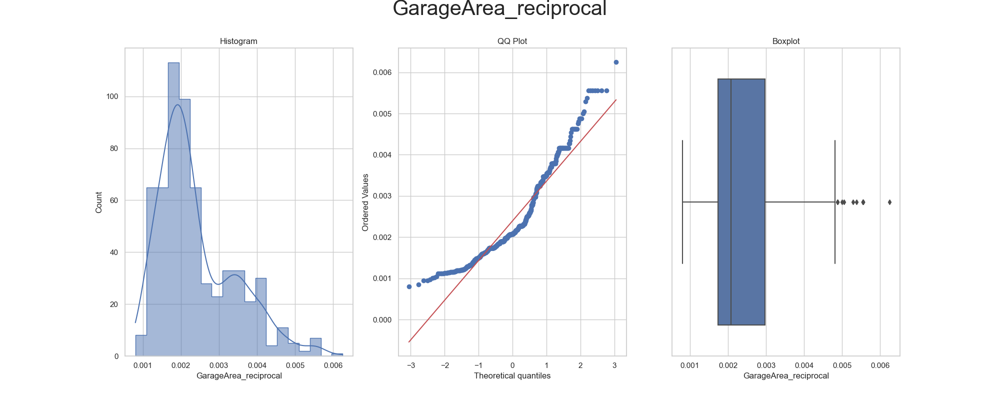

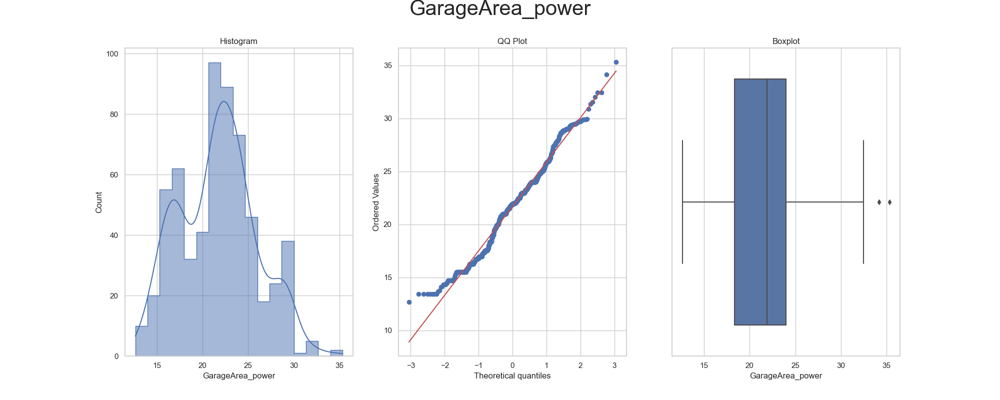

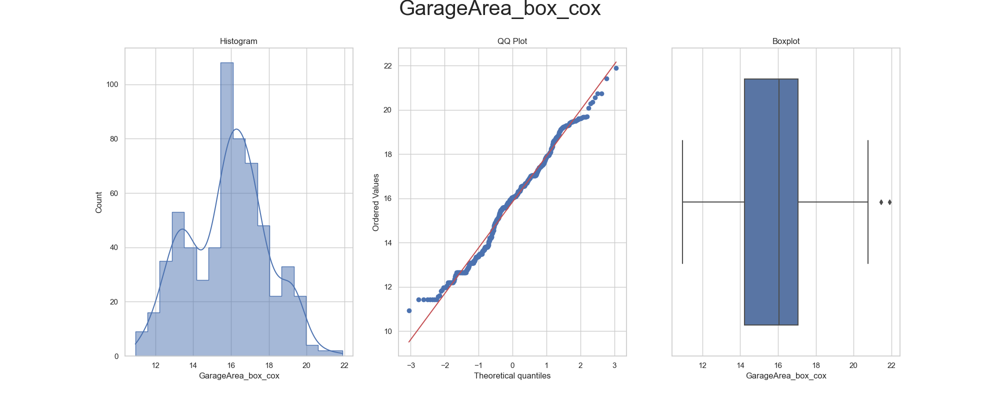

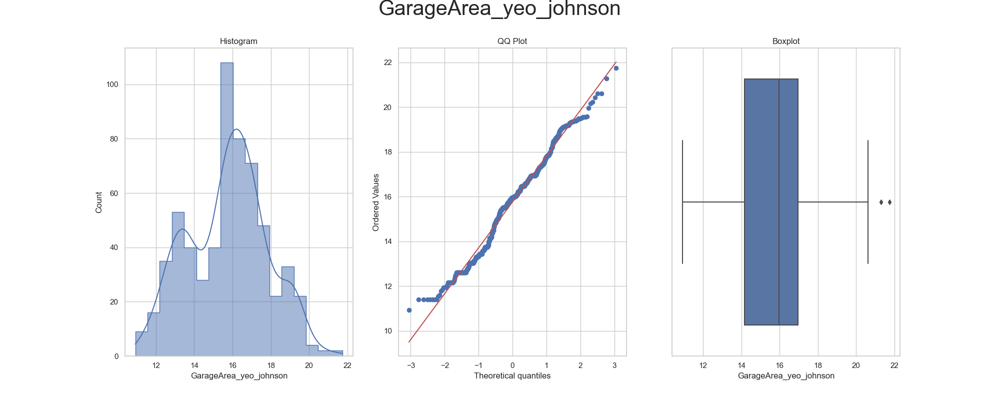



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



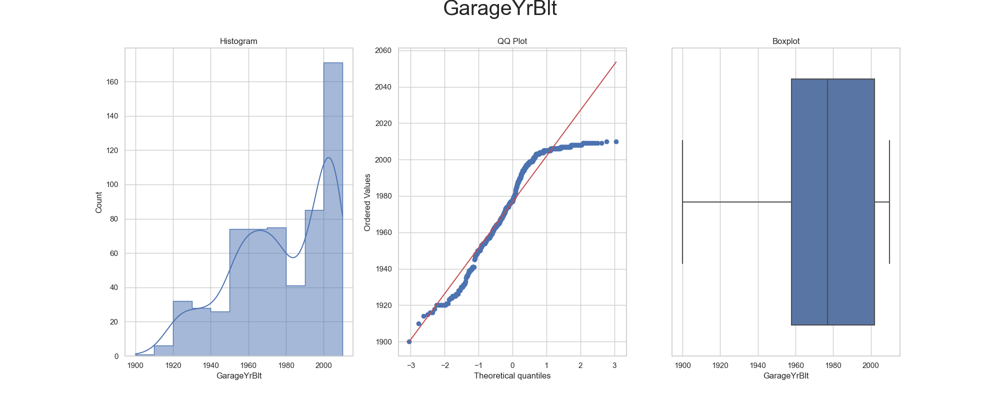

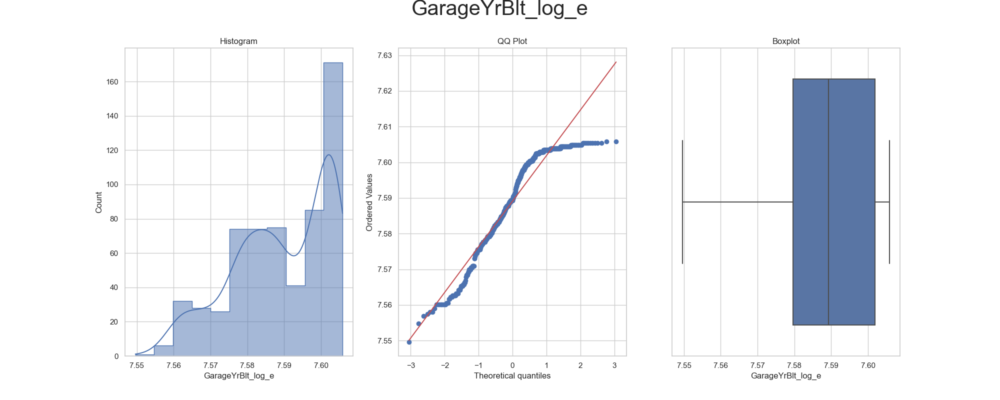

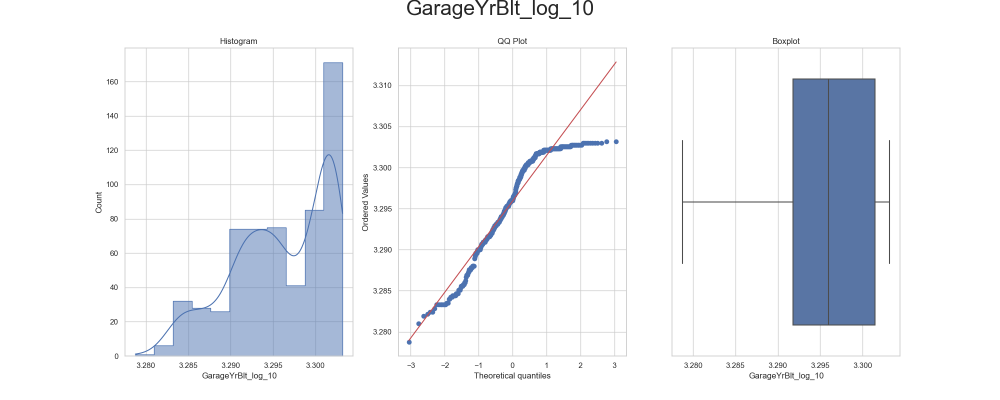

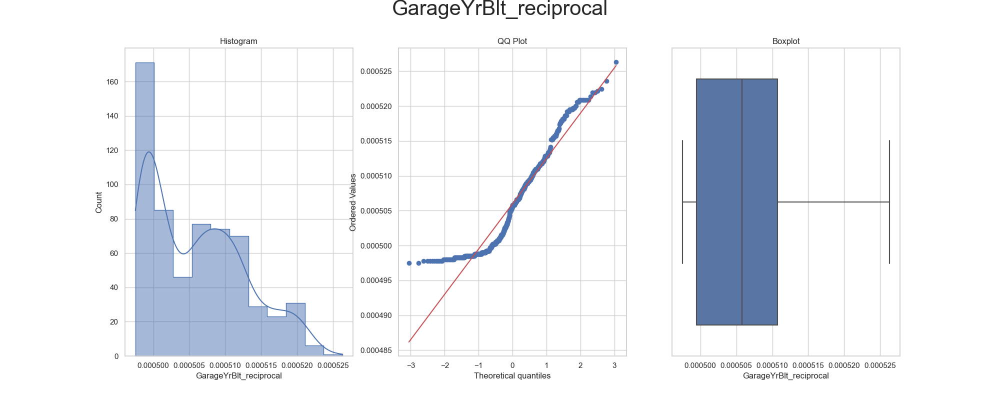

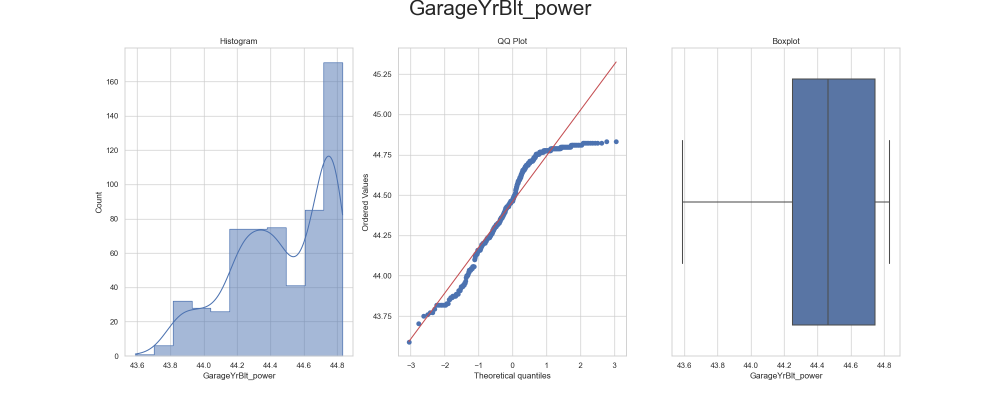

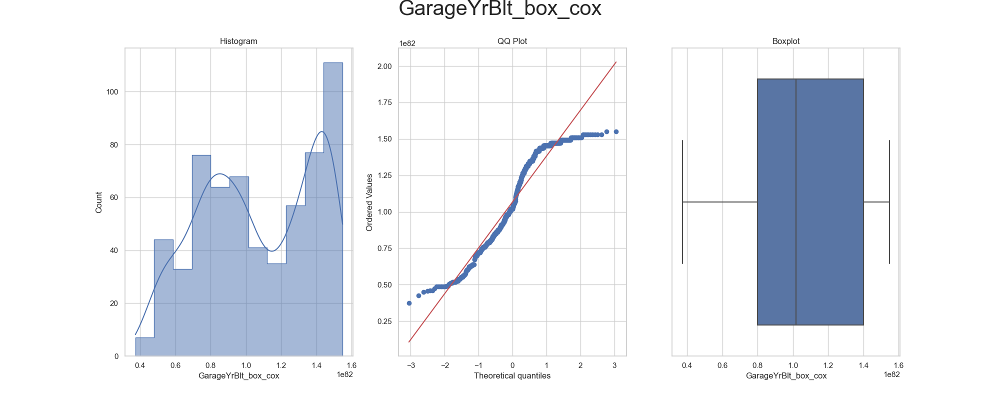

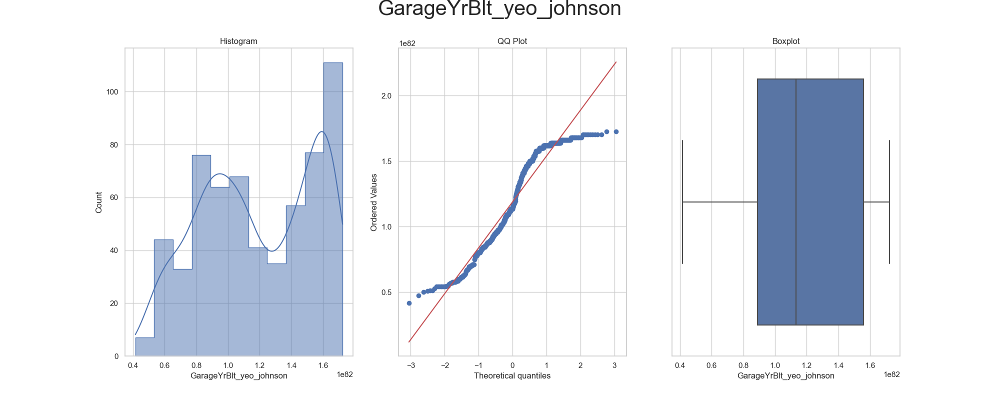



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



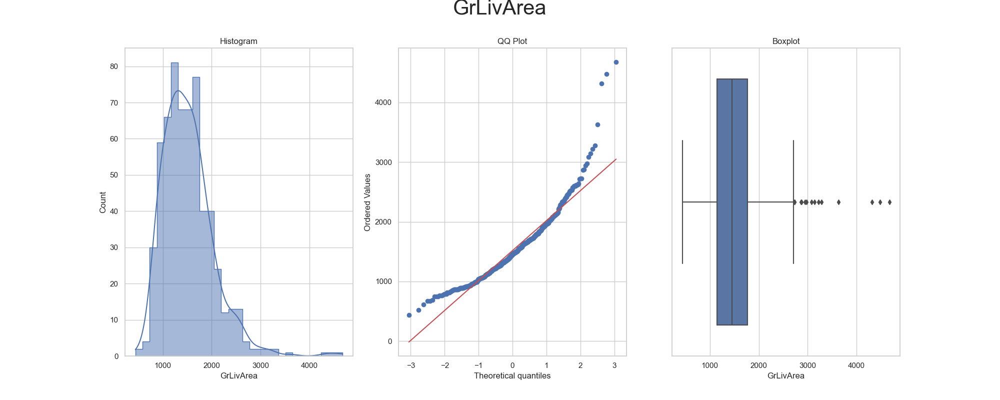

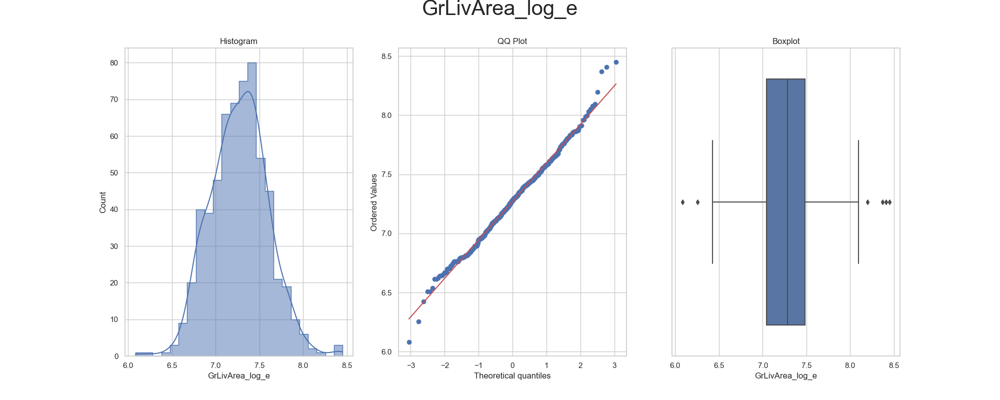

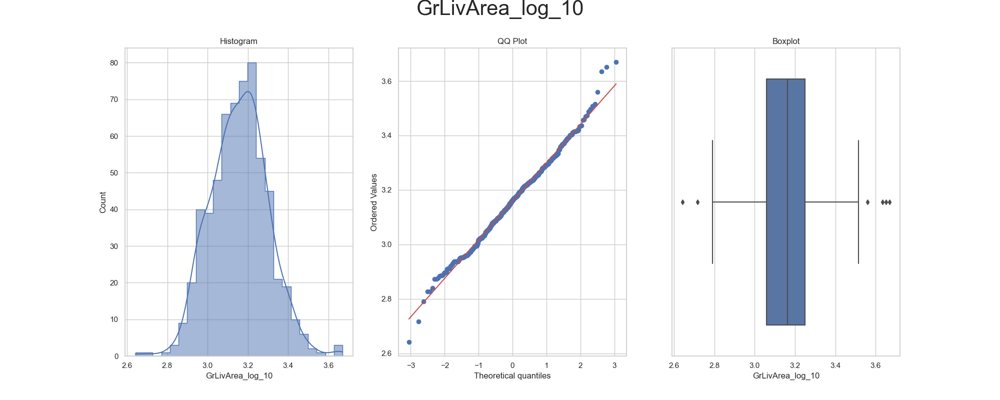

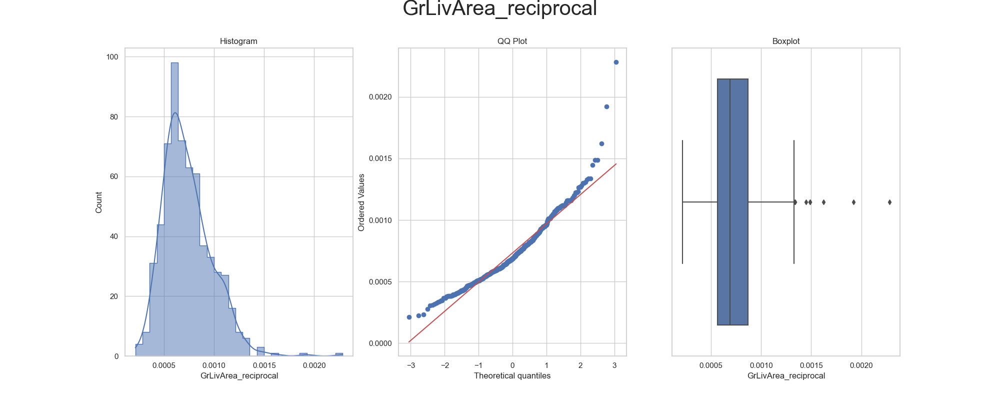

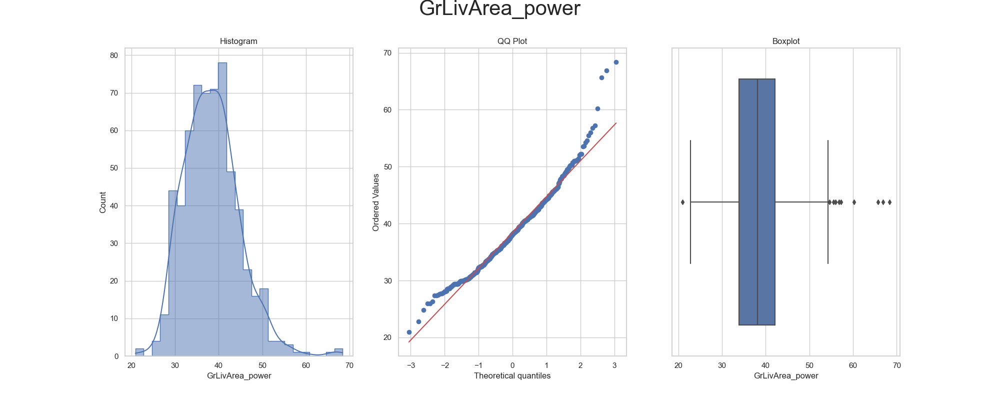

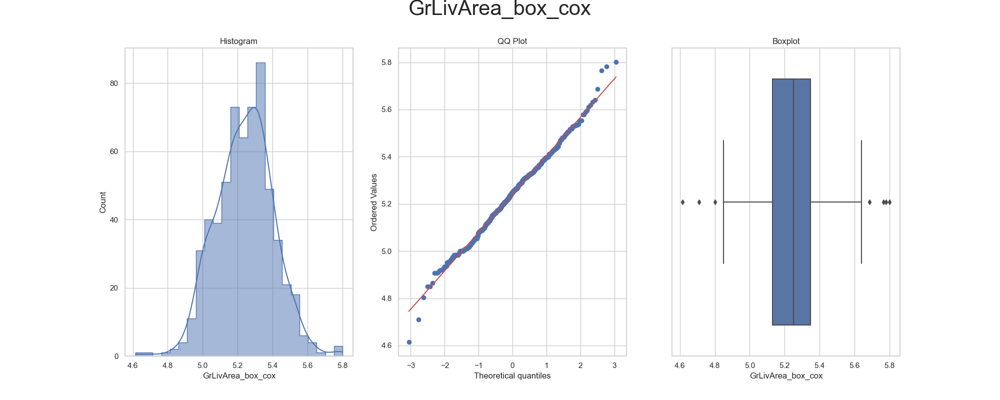

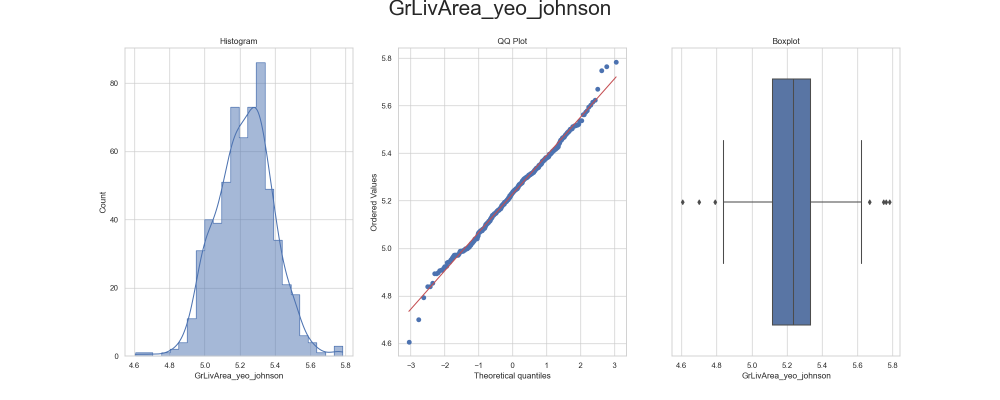



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



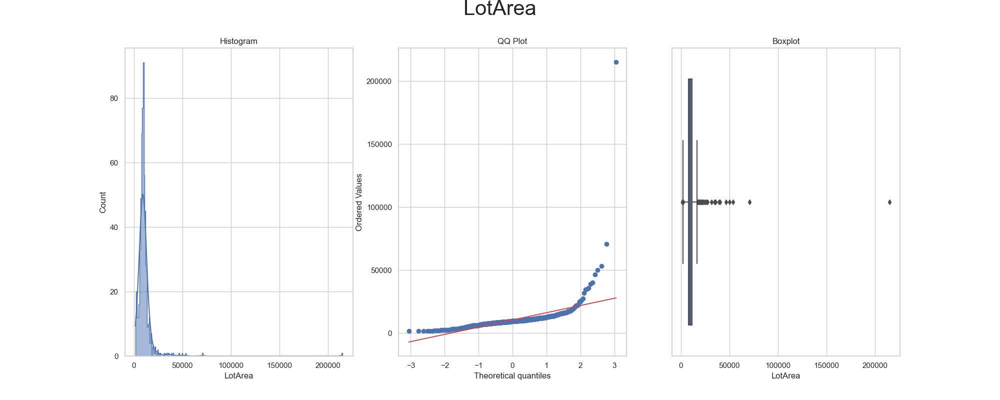

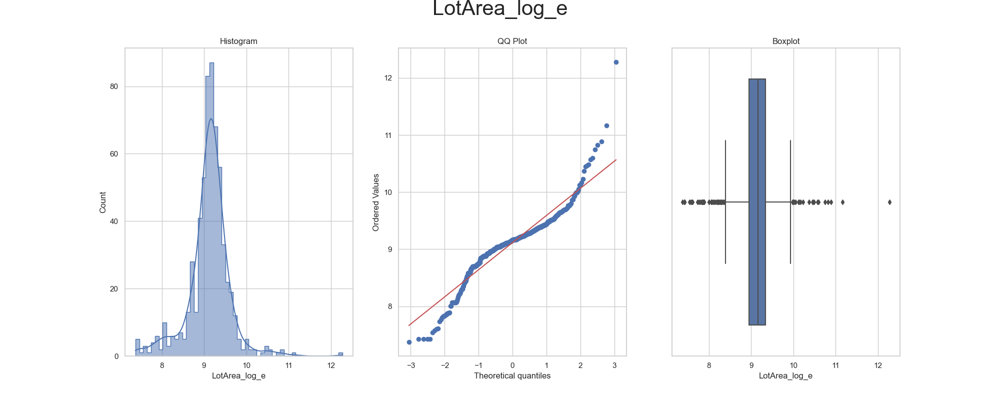

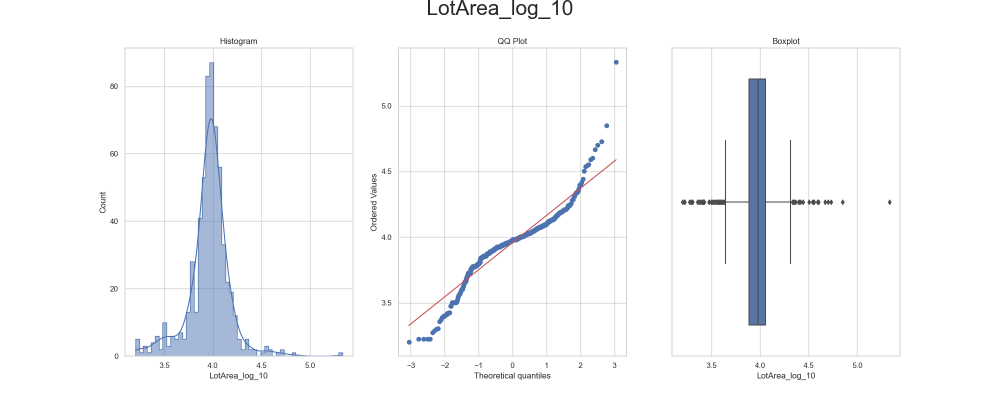

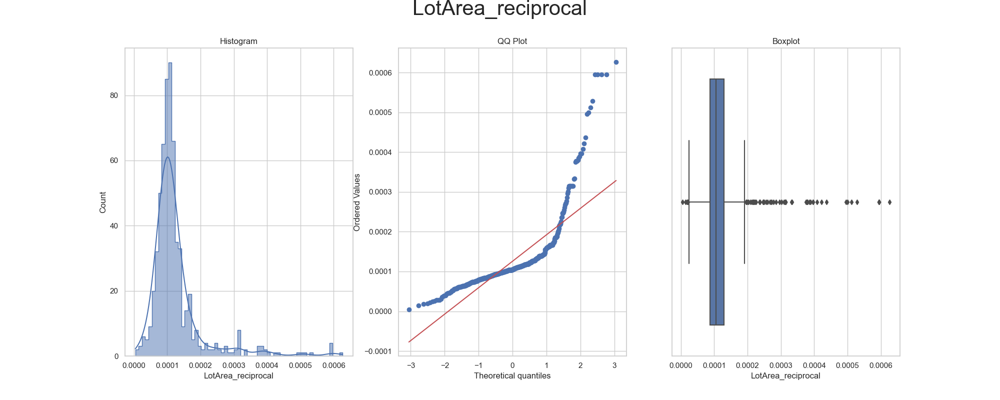

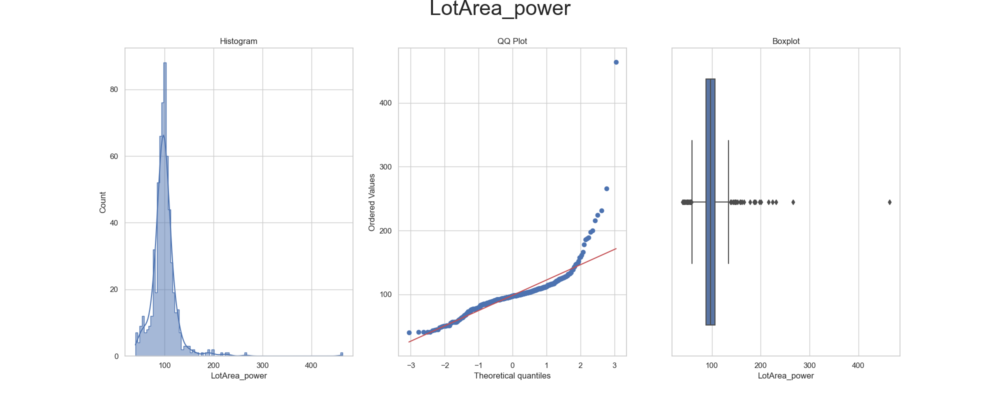

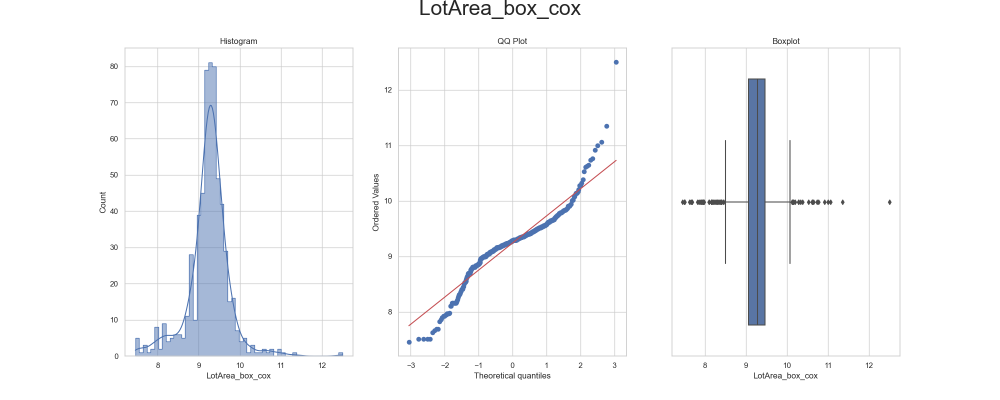

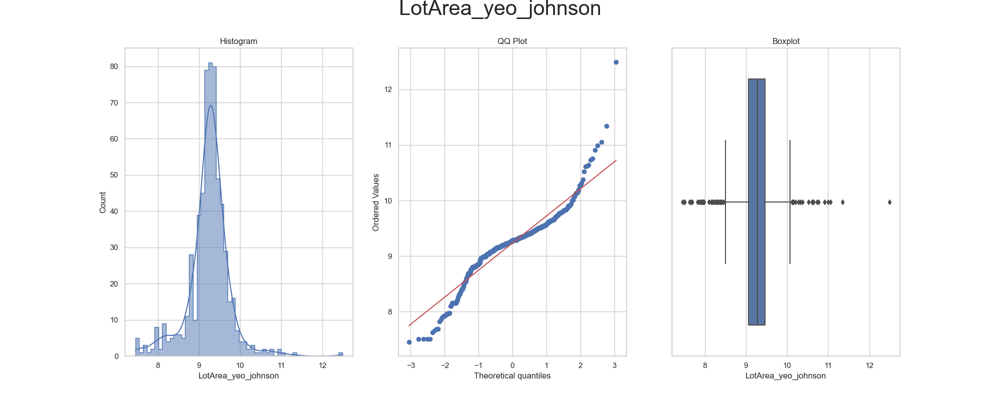



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



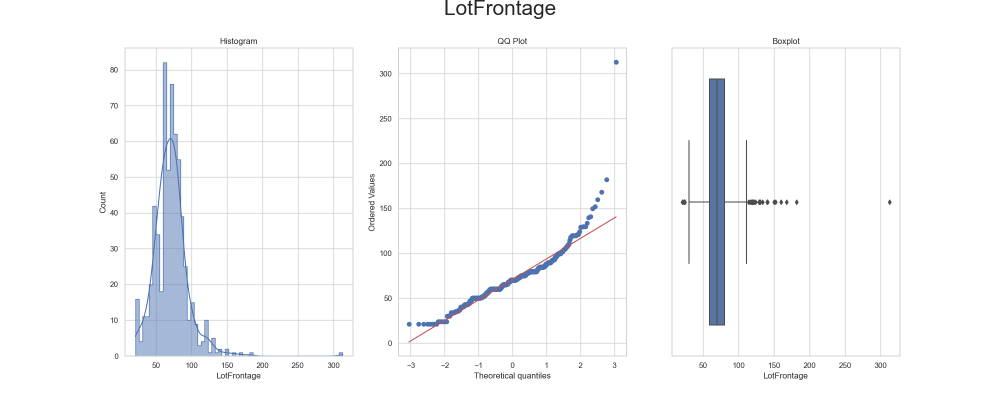

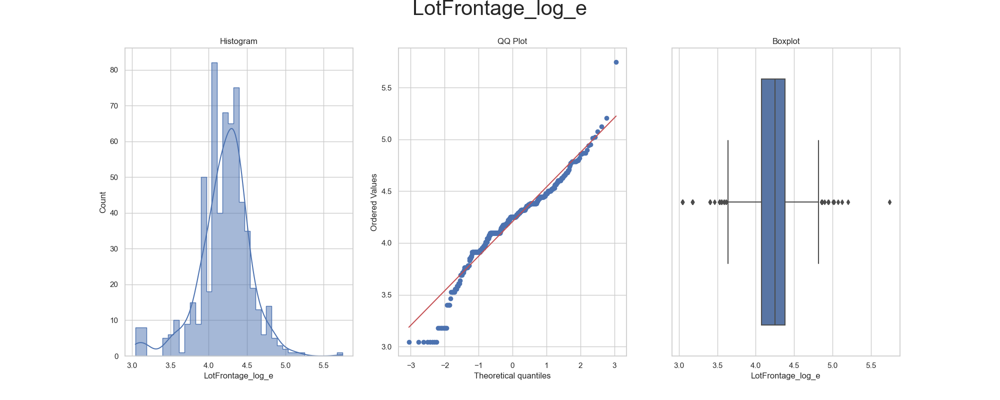

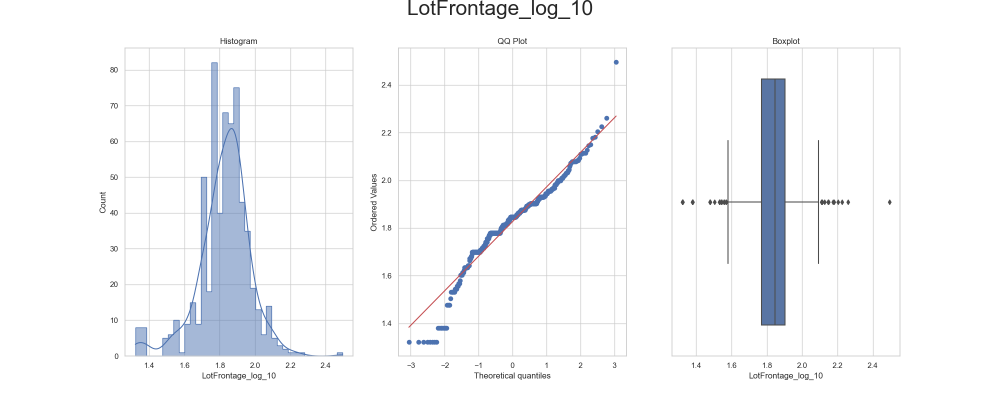

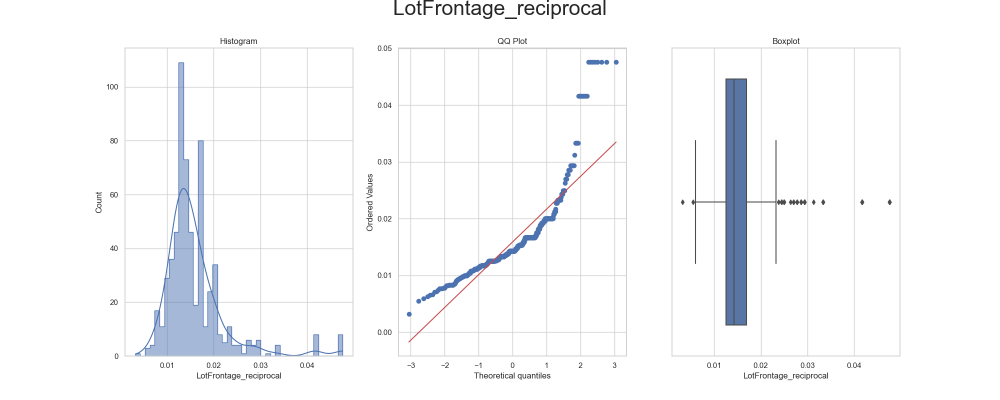

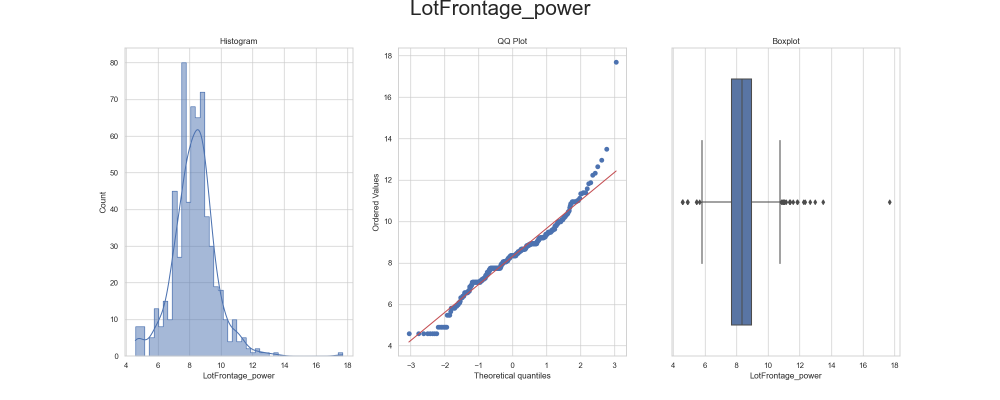

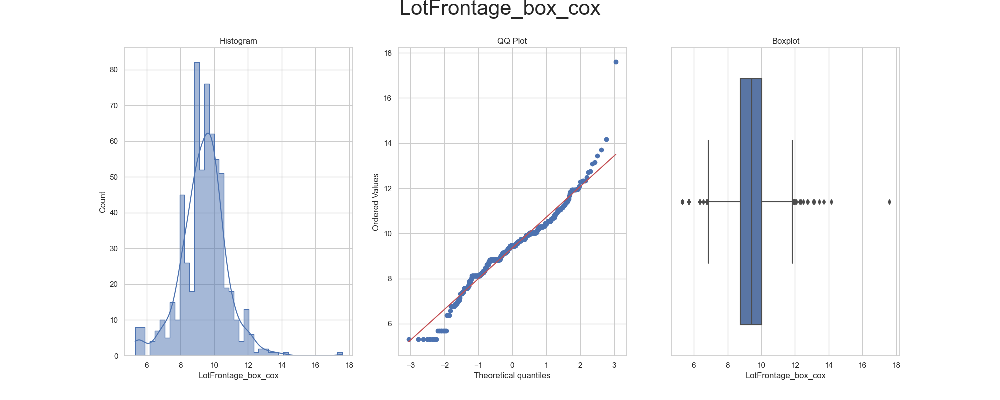

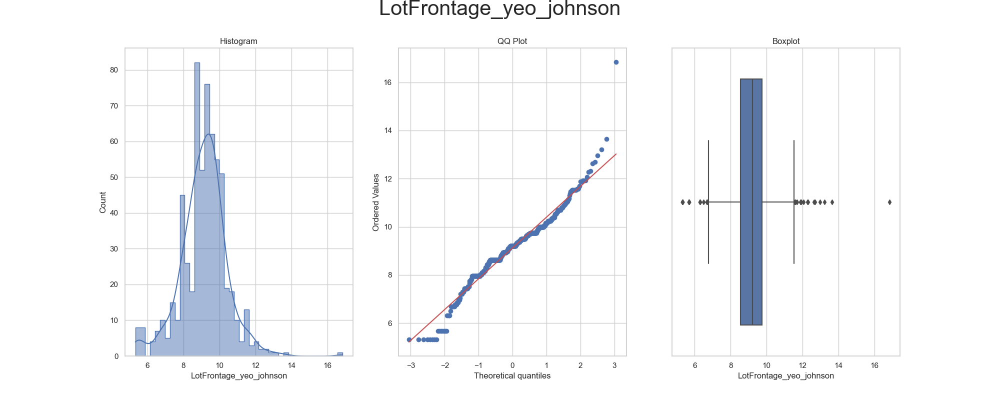



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_power', 'OpenPorchSF_yeo_johnson'] 



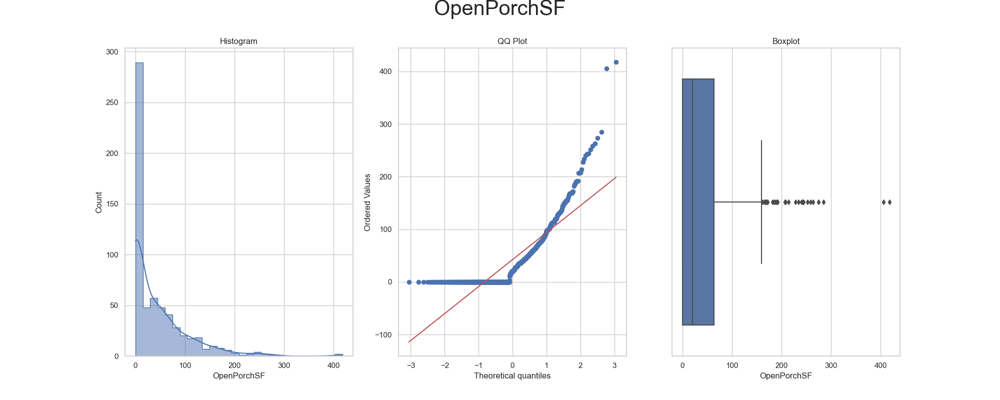

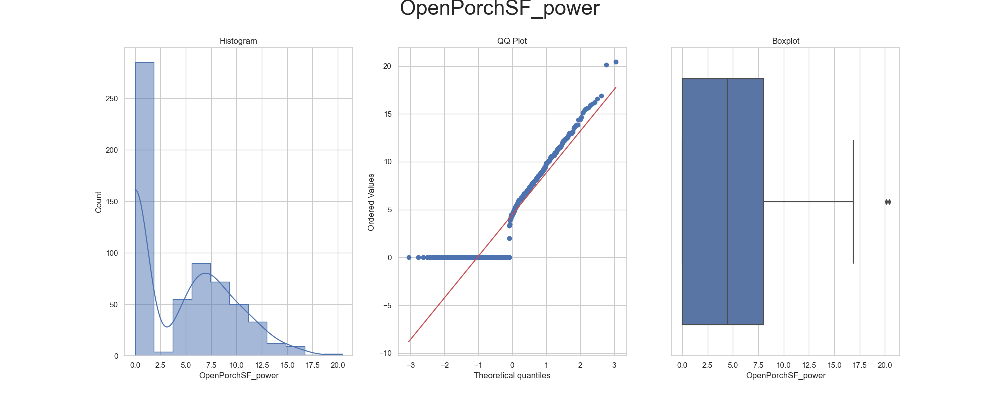

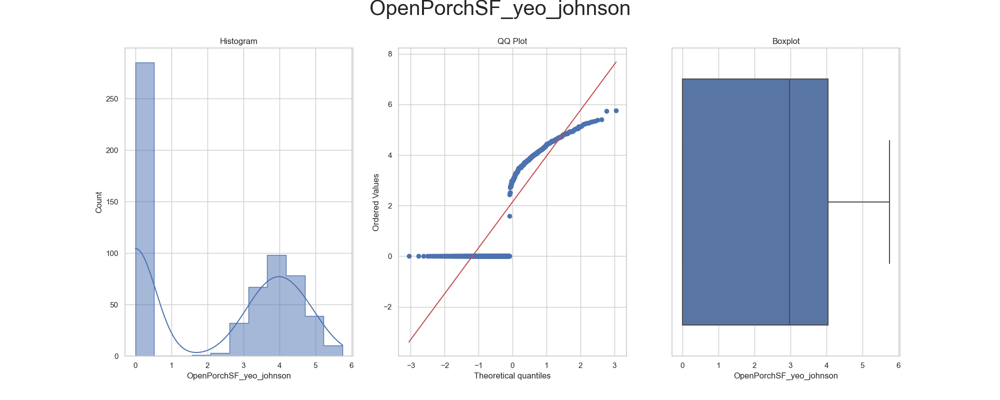



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_log_e', 'OverallCond_log_10', 'OverallCond_reciprocal', 'OverallCond_power', 'OverallCond_box_cox', 'OverallCond_yeo_johnson'] 



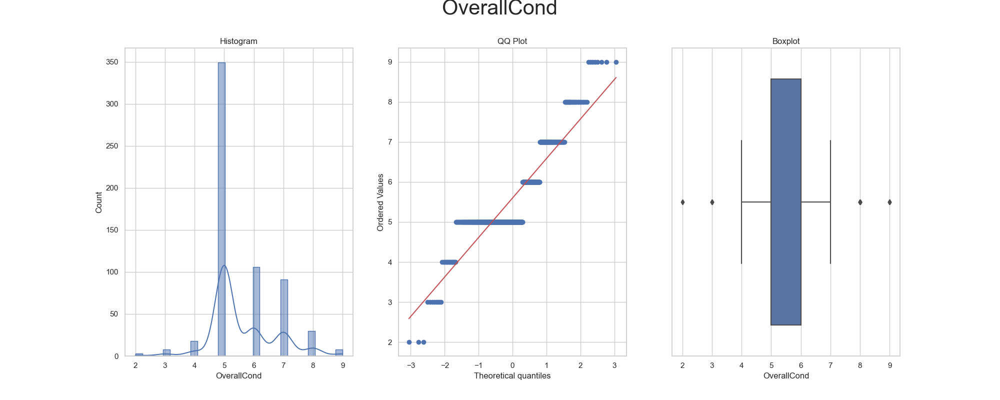

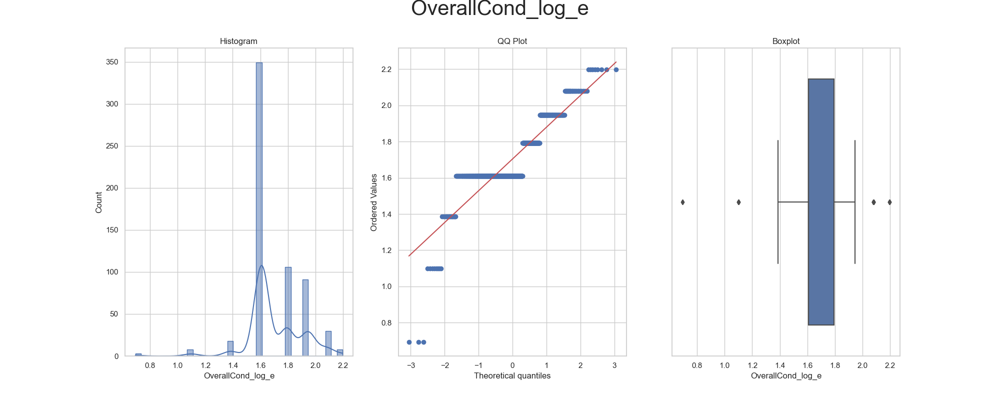

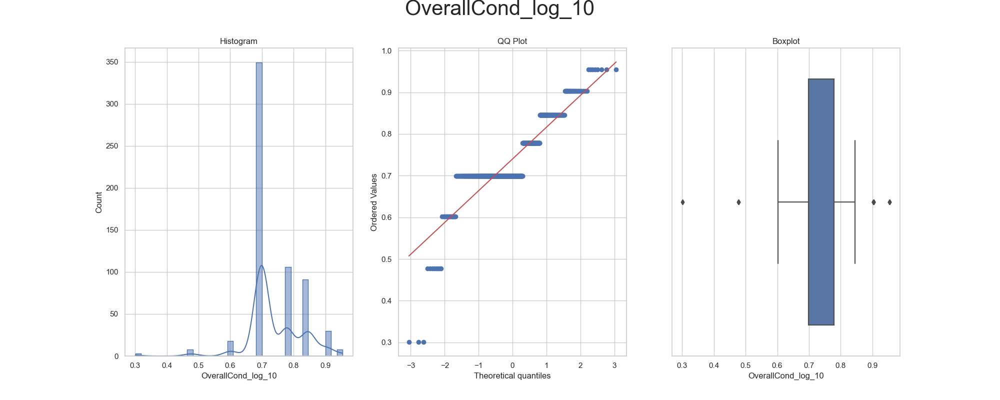

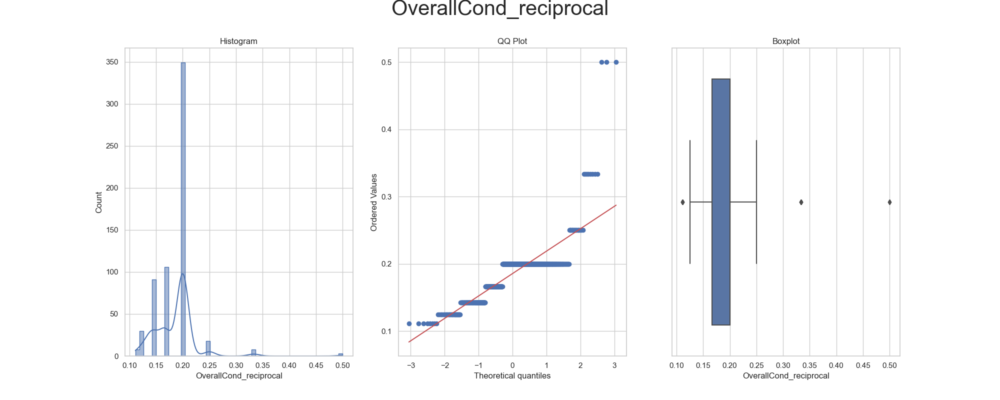

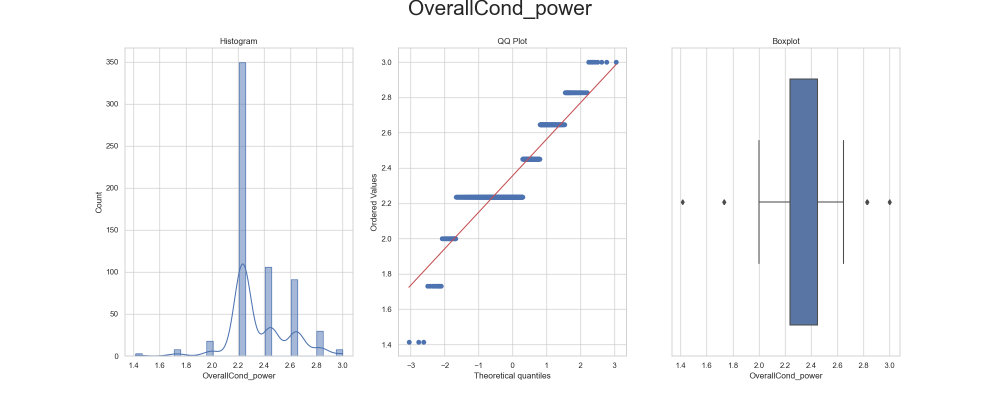

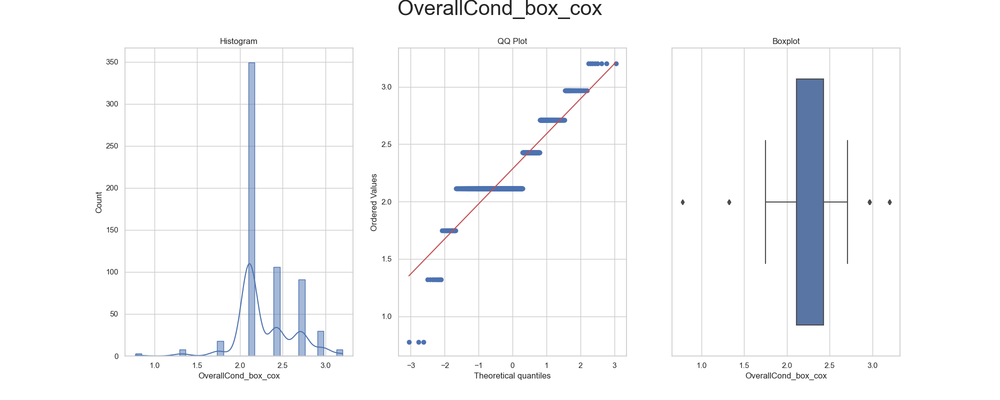

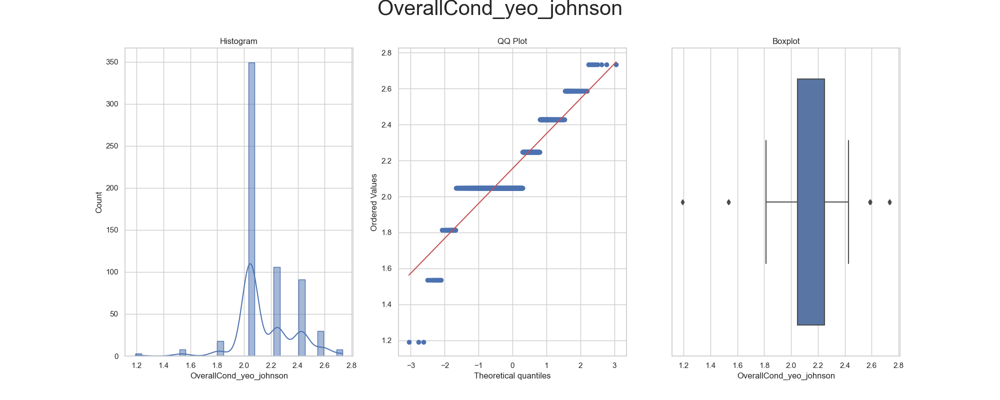



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_log_e', 'OverallQual_log_10', 'OverallQual_reciprocal', 'OverallQual_power', 'OverallQual_box_cox', 'OverallQual_yeo_johnson'] 



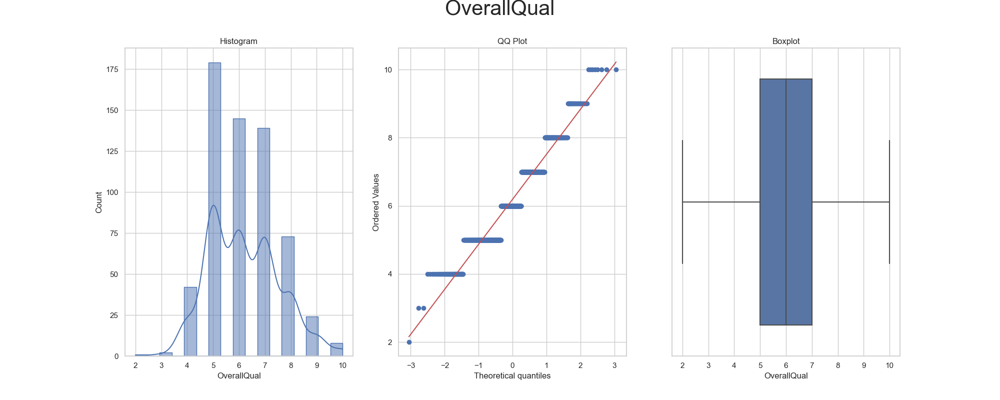

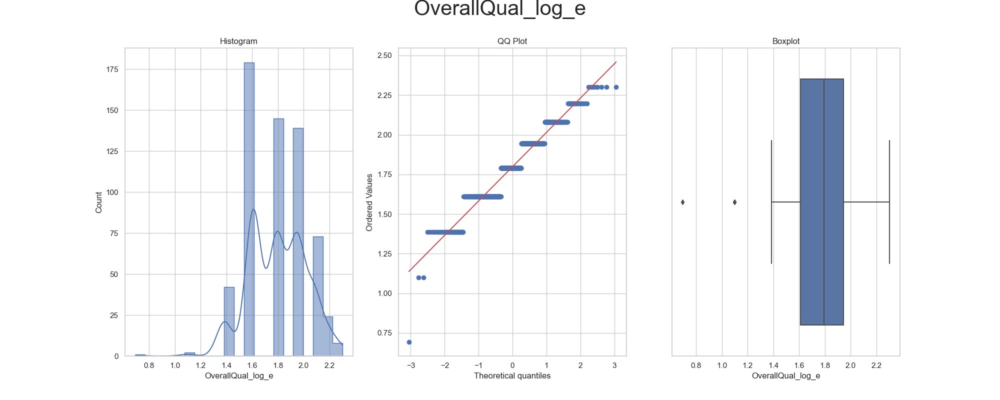

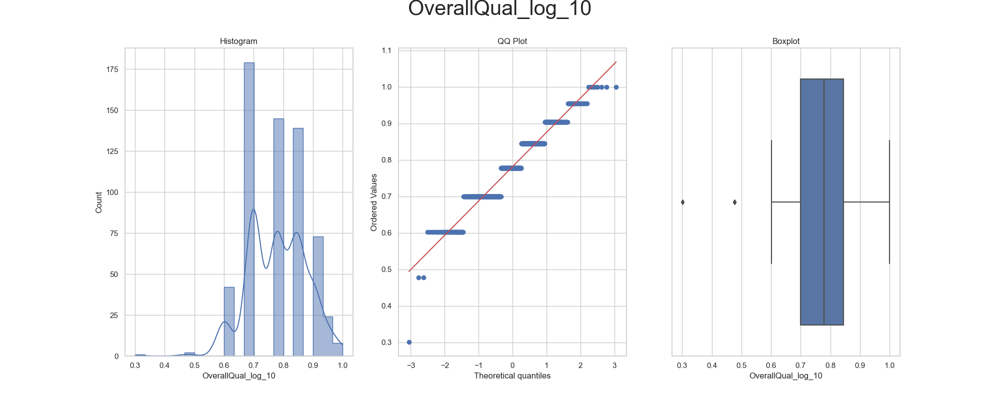

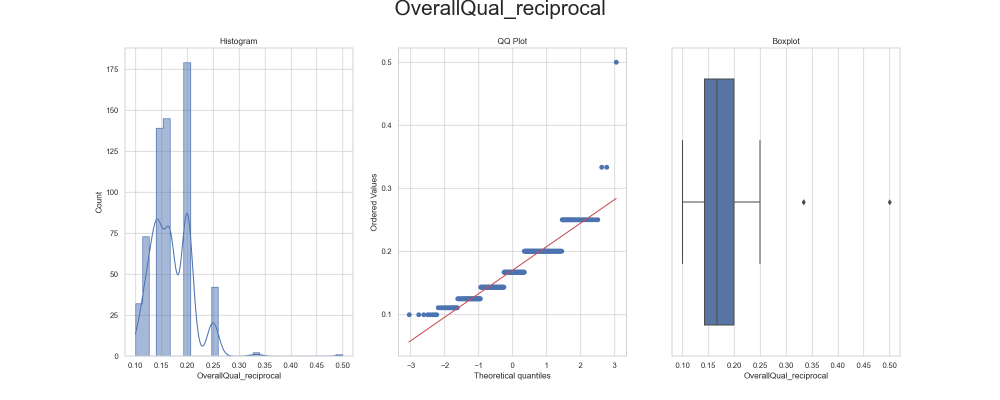

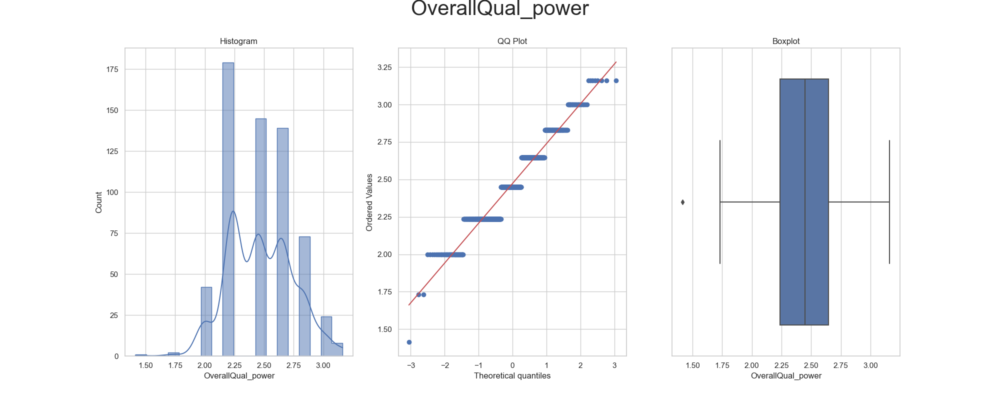

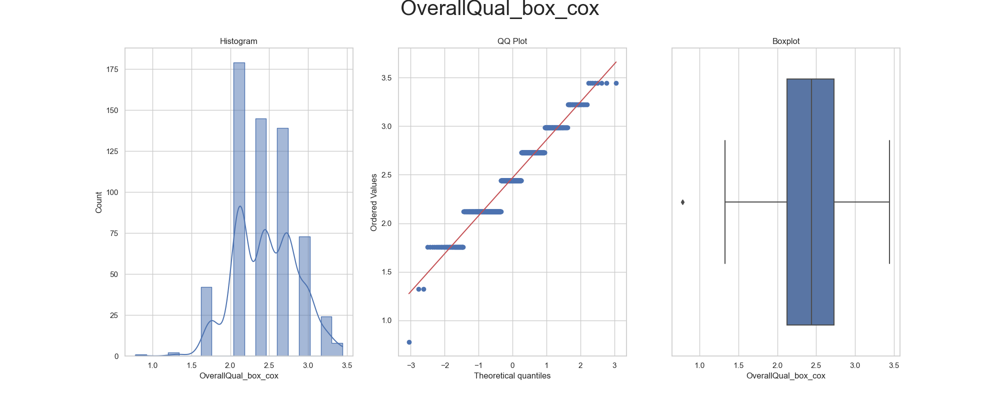

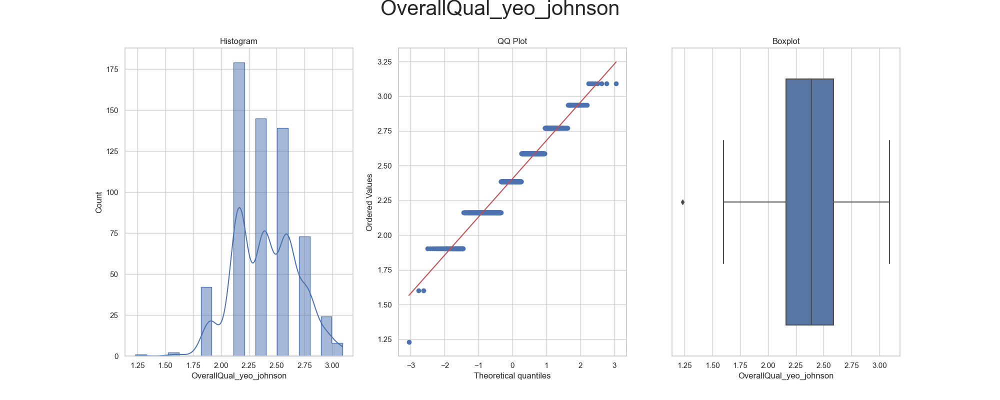



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_log_e', 'TotalBsmtSF_log_10', 'TotalBsmtSF_reciprocal', 'TotalBsmtSF_power', 'TotalBsmtSF_box_cox', 'TotalBsmtSF_yeo_johnson'] 



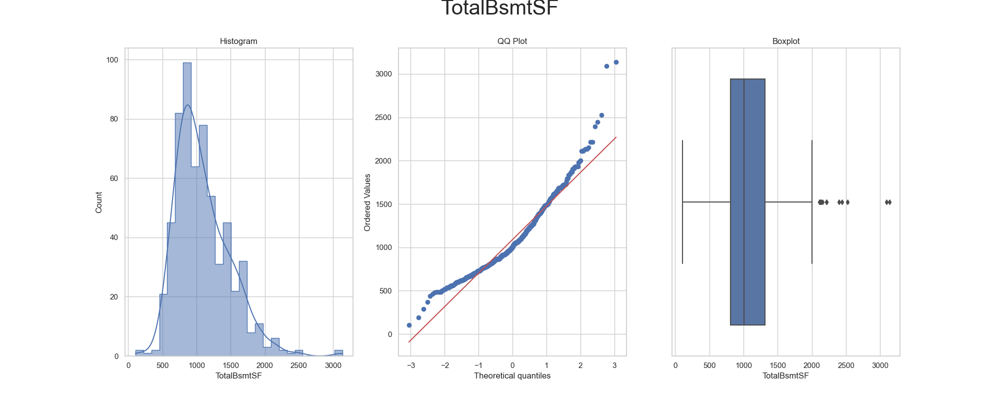

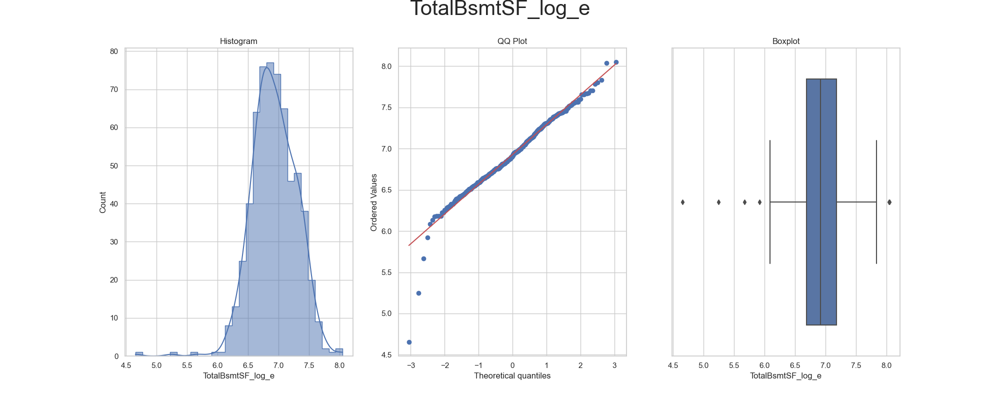

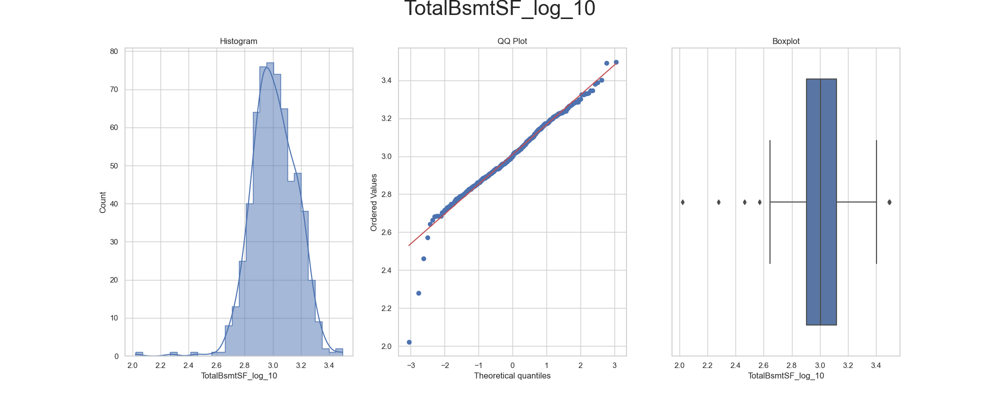

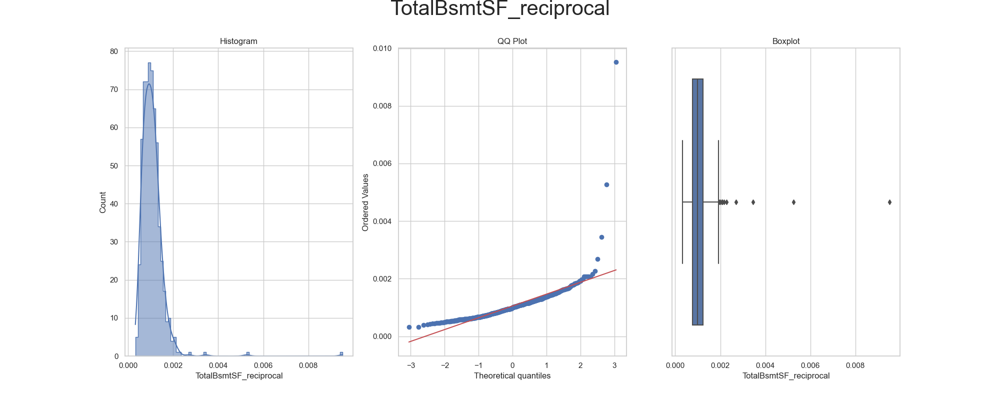

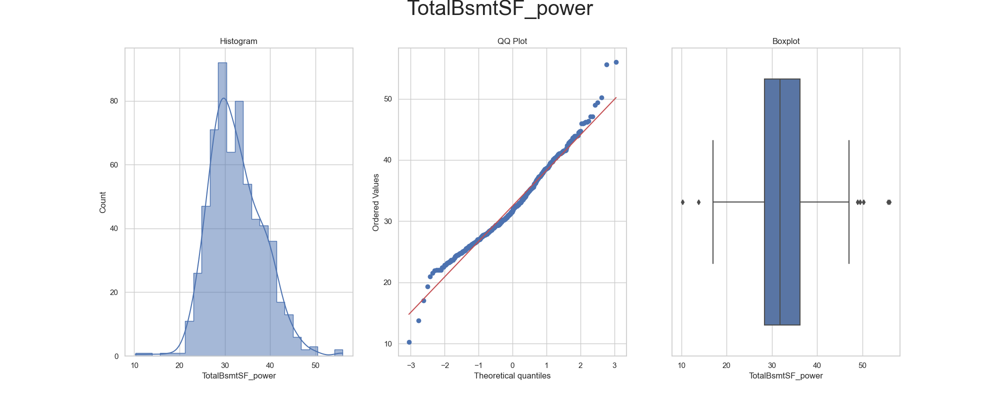

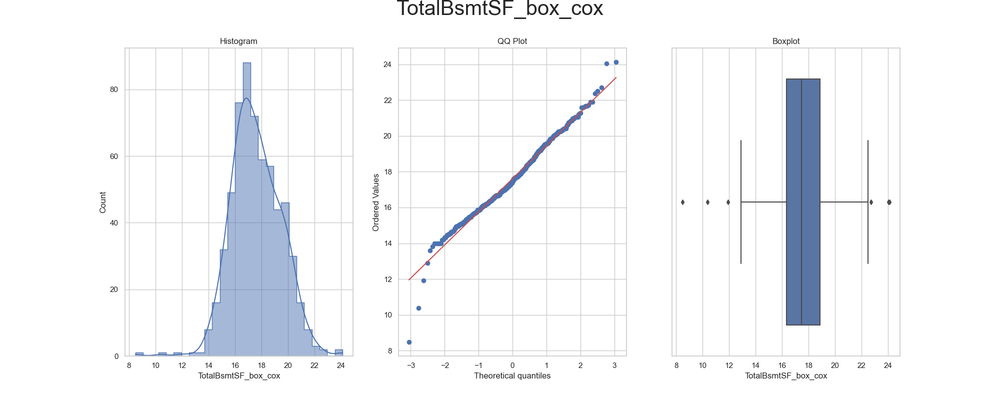

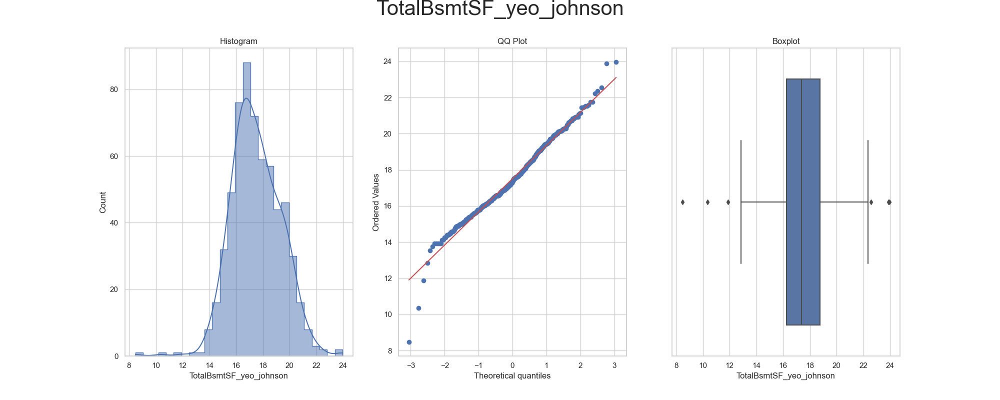



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



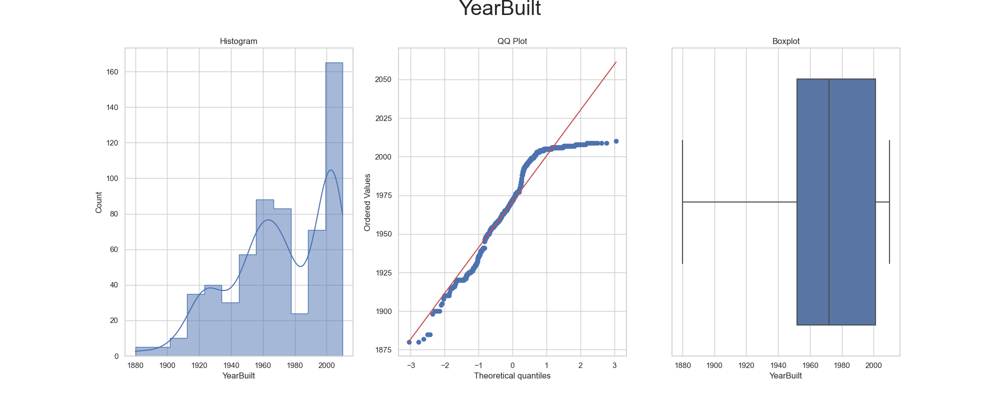

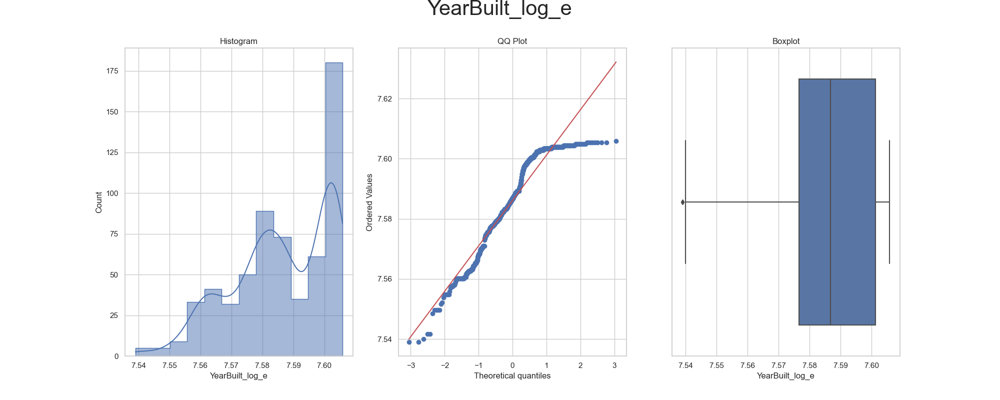

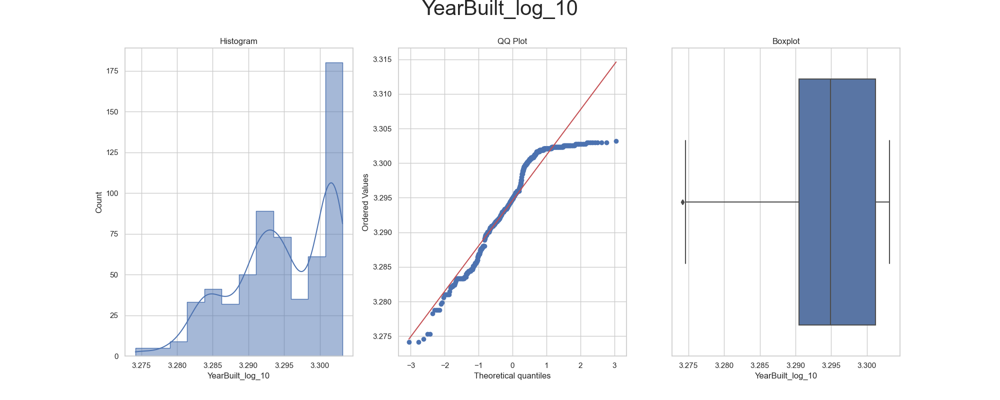

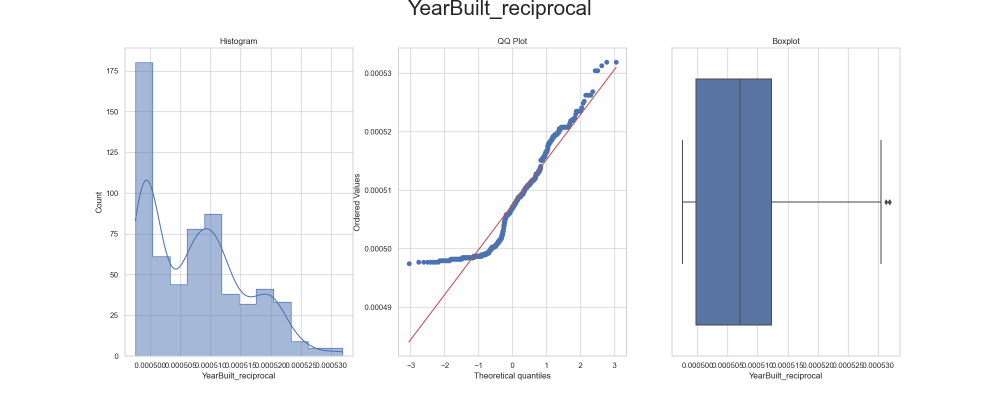

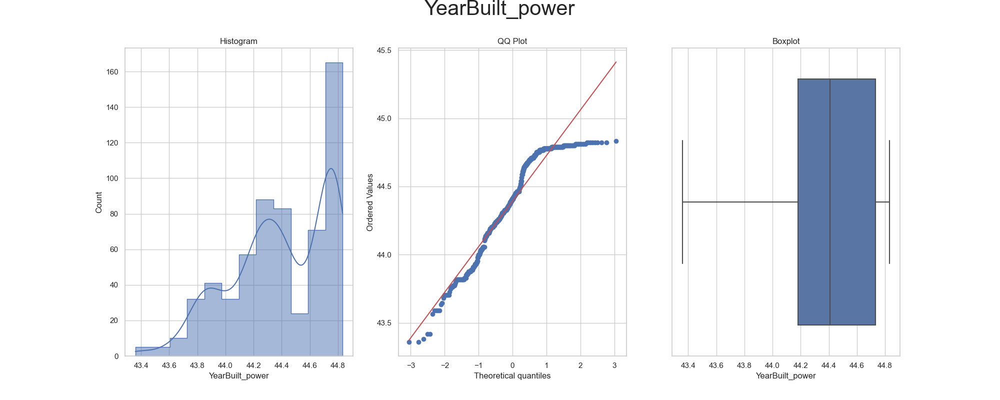

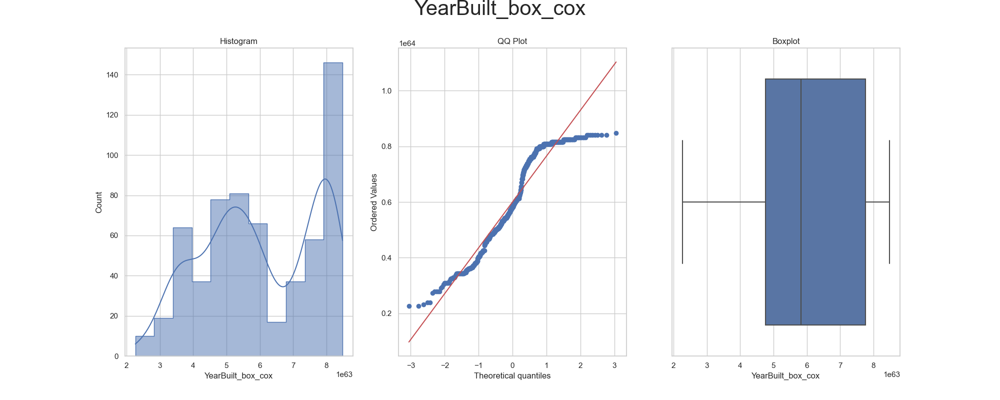

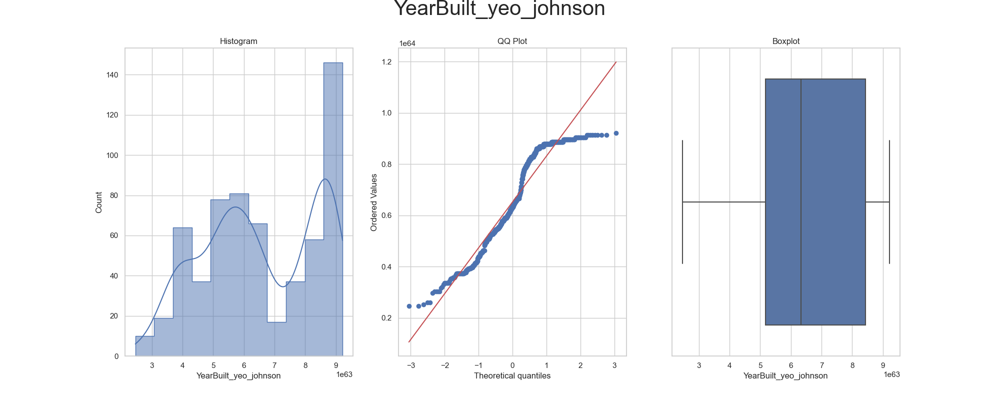



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



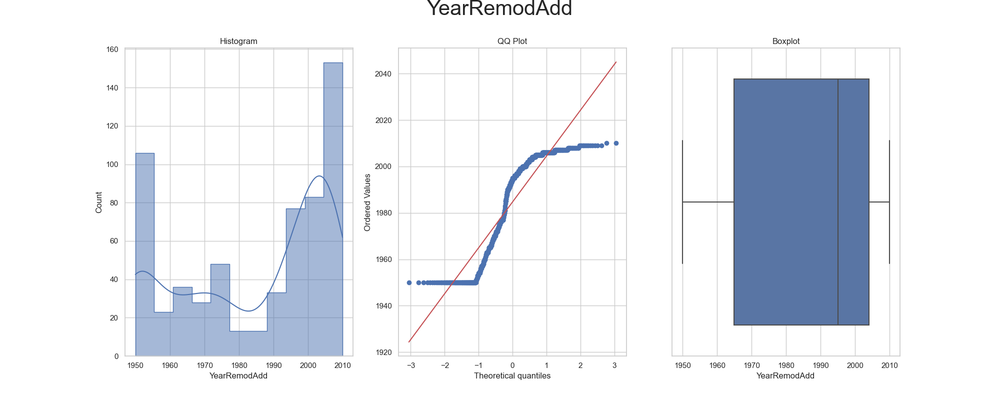

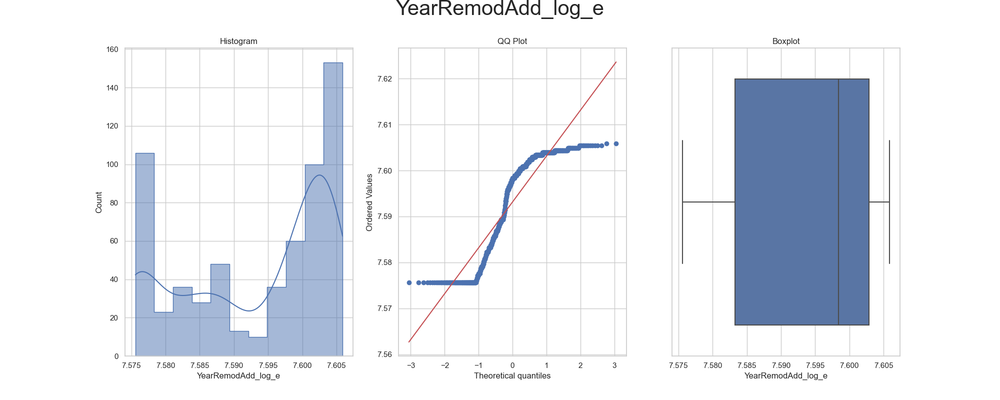

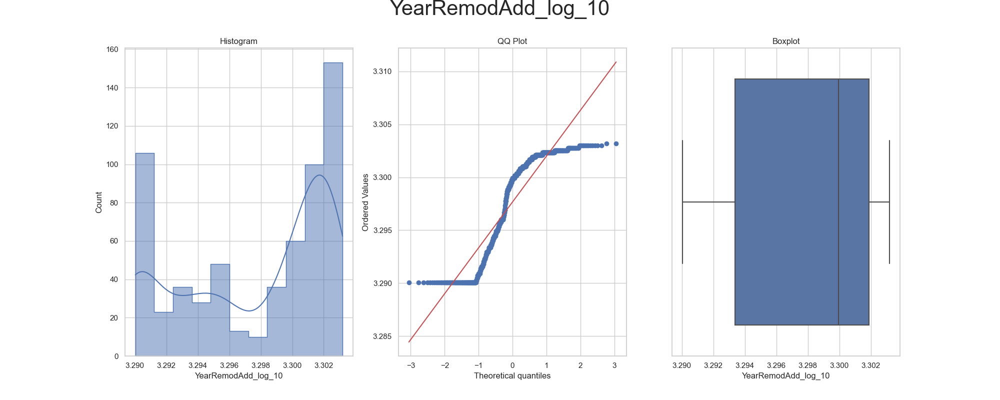

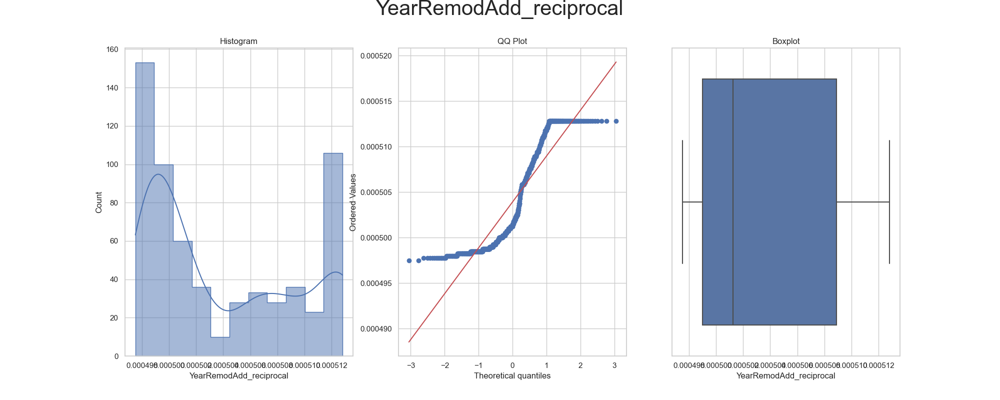

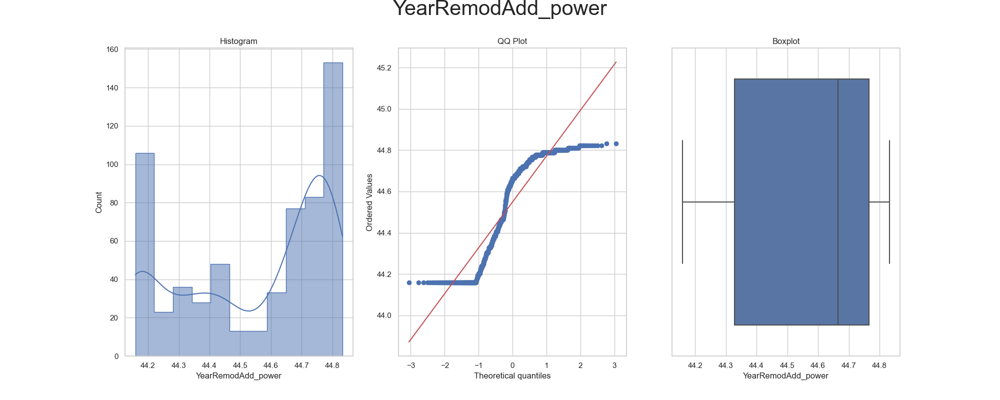

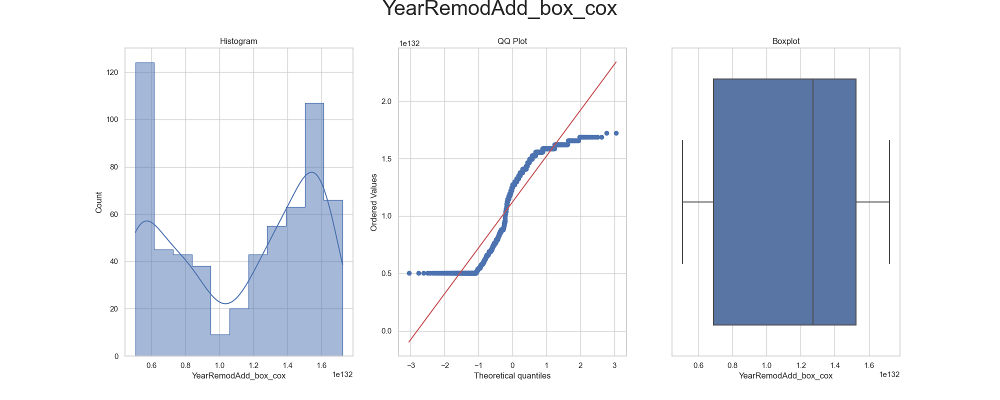

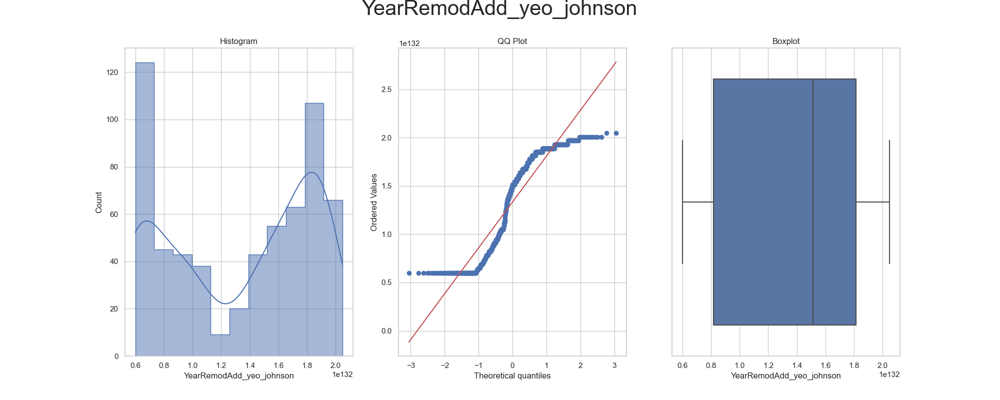

In [14]:
df_engineering = FeatureEngineeringAnalysis(df=df_engineering, analysis_type='numerical')

In [15]:
from sklearn.preprocessing import StandardScaler

# 1. Create a transformer
scaler = StandardScaler()

# 2. Fit-Transform into TrainSet
XtrainSet[features_engineering] = scaler.fit_transform(TrainSet[features_engineering])

# 3. Transform into TestSet
XTestSet[features_engineering] = scaler.fit_transform(TestSet[features_engineering])

print("* Numerical transformation - StandardScaler transformation inplace")

* Numerical transformation - StandardScaler transformation inplace


In [16]:
df_engineering = XtrainSet.copy()
df_engineering.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,KitchenQual,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd
0,2.620116,-0.799772,1.444987,Av,0.073750,ALQ,0.281694,0.471600,Unf,-1.022132,...,Gd,0.209087,0.539804,-0.544982,-0.225792,1.288280,-0.139127,0.282433,-0.678409,0.765977
1,1.183042,-0.799772,0.168651,Av,-0.940203,GLQ,2.226678,2.018371,RFn,1.084812,...,Gd,0.070543,0.622179,0.742787,0.279601,-0.550406,0.596088,1.318786,1.114532,1.000538
6,0.649422,-0.799772,0.168651,Mn,1.245231,GLQ,-0.474813,0.471600,Unf,0.433575,...,Gd,0.094899,2.434427,-0.544982,-0.714338,-0.550406,-0.139127,0.760363,0.560351,0.156119
10,0.892457,-0.799772,-1.107684,No,-0.949077,GLQ,1.635797,-0.272348,Fin,1.084812,...,Gd,-0.721078,-1.148881,-0.469863,-0.377410,-0.550406,0.596088,0.644654,1.114532,1.000538
12,-1.305421,0.750990,0.168651,No,0.027157,Rec,-0.857543,-0.106432,Unf,-0.485819,...,TA,0.019267,-0.489882,-0.544982,1.442005,1.288280,-0.874342,-1.050740,-1.656376,0.578328


* Create engineered variables(s) intergrate transformation(s)

In [17]:
from feature_engine.selection import SmartCorrelatedSelection
corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.6, selection_method="variance")

corr_sel.fit_transform(df_engineering)
corr_sel.correlated_feature_sets_

[{'1stFlrSF', 'TotalBsmtSF'},
 {'2ndFlrSF', 'GrLivArea'},
 {'BsmtFinSF1', 'BsmtUnfSF'},
 {'GarageArea', 'GarageYrBlt'},
 {'LotArea', 'LotFrontage'},
 {'OverallQual', 'YearBuilt'}]

In [18]:
corr_sel.features_to_drop_

['BsmtFinSF1',
 'GarageYrBlt',
 'GrLivArea',
 'LotArea',
 'TotalBsmtSF',
 'YearBuilt']

## Conclusion
Based on the transformations applied to each variable, we can draw conclusions on their effectiveness:

* **KitchenQual**: This is the only categorical variable that is relevant to my analysis. I observed that the encoding assigned could be improved to resemble linearity and improve predictability for this feature. The encoding assigned ordinal values as follows:

**0 => TA**

**1 => Gd**

**2 => Fa**

**3 => Ex**


I would explore given more time how to apply instead the following encoding: 

**0 => Po**

**1 => Fa**

**2 => TA**

**3 => Gd**

**4 => Ex**

* **OverallQual**: The transformation doesn't seem to decrease the skewness of the variable, with the exception of our transformer. Which appears to improve matters slightly. OverallQual seems to be the most important variable in the dataframe.

* **BedroomAbvGr**: Similar to **1stFlrSF**, a variety of transformations were applied, indicating potential skewness in the data distribution.

* **BsmtFinSF1**, **BsmtUnfSF**, **GarageArea**, **MasVnrArea**, **OpenPorchSF**, **TotalBsmtSF**: Similar to **2ndFlrSF**, only two transformations were applied to these variables, suggesting relatively less skewness in their distributions.

* **GarageYrBlt**, **GrLivArea**, **LotArea**, **LotFrontage**, **OverallCond**, **OverallQual**, **YearBuilt**, **YearRemodAdd**: A wide range of transformations were applied to these variables, indicating potential skewness and the need to normalize the data distribution.